In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import argparse
import pandas as pd
import numpy as np
import importlib
import tfsplt_future_past_utils as pu

In [ ]:
# define parameters
class Args(argparse.Namespace):

    rois = ["IFG","MTG", "STG","preCG","postCG", "rostralmiddlefrontal",
        "superiorfrontal", "supramarginal", "ITG", "TP", "fusiform", "All"]
    # rois = ["IFG","STG","preCG","postCG","TP","dSM","mSM","vSM", "All"]    
    
    # NOTE: lines must match the label3 values in the data (standardized without _banded_ prefix)
    lines = ["joint", "word", "sentence", "sentence2"] # line id
    # colors = ["green", "grey", "orange", "red", "black", "purple"]
    colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    legends = ["joint", "word", "future", "past"]

    lags = {
            "lags_all": np.arange(-2000, 2001, 50),
            "lags_plt": np.arange(-2000, 2001, 50), # selected subset
            "lag_ticks": np.arange(-2000, 2001, 500), # this and next one need to have same number of elements
            "lag_tick_labels": np.arange(-2, 2.001, 0.5), # this and previous one need to have same number of elements
        }
    res_dir = '/scratch/gpfs/gidon/247-plotting/results/figures'

In [ ]:
args = Args()
all_elecs = pd.read_csv("/scratch/gpfs/HASSON/kw1166/247/247-plotting/data/plotting/paper-sts/base_df.csv")
thresh_single = None 
res_d = "/scratch/gpfs/HASSON/gidon/247-encoding-dev/results/tfs"
res_d_itamar = "/scratch/gpfs/HASSON/ij9216/projects/code/247/247-encoding-dev/results/tfs"

# For plotting, we want to align all results to the same lag window (ms).
# This avoids fragile iloc-based indexing when different result files have different lag grids.
LAG_MIN, LAG_MAX = -2000, 2000

# Pick up any edits to the utils module without restarting the kernel.
importlib.reload(pu)

#Original, trained
original8_c = pu.load_res_add_roi_threshold(f"{res_d_itamar}/ij-tfs-%s-gpt2-xl-bandedRidge-lag30k-50-all-static_future_past-noreph_pca300_30s_context8_comp.csv", thresh_single)
original8_p = pu.load_res_add_roi_threshold(f"{res_d_itamar}/ij-tfs-%s-gpt2-xl-bandedRidge-lag30k-50-all-static_future_past-noreph_pca300_30s_context8_prod.csv", thresh_single)
print(f"Loaded original sentences: {len(original8_c)} comprehension, {len(original8_p)} production electrodes")
original8_c = pu.select_lag_range_and_last_columns(original8_c, LAG_MIN, LAG_MAX)
original8_p = pu.select_lag_range_and_last_columns(original8_p, LAG_MIN, LAG_MAX)

#Opposite meaning
# opposite_meaning_sentence8_c = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-gpt2-xl-bandedRidge-lag60-50-all-static_future_past-opposite_meaning_sentence_pca300_drop-short_mistral_trained_rephrased_sentence_cnxt_0008_comp.csv", thresh_single)
# opposite_meaning_sentence8_p = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-gpt2-xl-bandedRidge-lag60-50-all-static_future_past-opposite_meaning_sentence_pca300_drop-short_mistral_trained_rephrased_sentence_cnxt_0008_prod.csv", thresh_single)
# print(f"Loaded opposite meaning sentences: {len(opposite_meaning_sentence8_c)} comprehension, {len(opposite_meaning_sentence8_p)} production electrodes")
# opposite_meaning_sentence8_c = pu.select_lag_range_and_last_columns(opposite_meaning_sentence8_c, LAG_MIN, LAG_MAX)
# opposite_meaning_sentence8_p = pu.select_lag_range_and_last_columns(opposite_meaning_sentence8_p, LAG_MIN, LAG_MAX)
# opposite_meaning_sentence8_c['label3'] = opposite_meaning_sentence8_c['label3'].str.replace('_banded_', '', regex=False)
# opposite_meaning_sentence8_p['label3'] = opposite_meaning_sentence8_p['label3'].str.replace('_banded_', '', regex=False)

#Random content word
random_content_word8_c = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-gpt2-xl-bandedRidge-lag60-50-all-static_future_past-random_content_words_pca300_drop-short_mistral_trained_rephrased_sentence_cnxt_0008_comp.csv", thresh_single)
random_content_word8_p = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-gpt2-xl-bandedRidge-lag60-50-all-static_future_past-random_content_words_pca300_drop-short_mistral_trained_rephrased_sentence_cnxt_0008_prod.csv", thresh_single)
print(f"Loaded random content word sentences: {len(random_content_word8_c)} comprehension, {len(random_content_word8_p)} production electrodes")
random_content_word8_c = pu.select_lag_range_and_last_columns(random_content_word8_c, LAG_MIN, LAG_MAX)
random_content_word8_p = pu.select_lag_range_and_last_columns(random_content_word8_p, LAG_MIN, LAG_MAX)
random_content_word8_c['label3'] = random_content_word8_c['label3'].str.replace('_banded_', '', regex=False)
random_content_word8_p['label3'] = random_content_word8_p['label3'].str.replace('_banded_', '', regex=False)

#Paraphrase
paraphrase8_c = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-gpt2-xl-bandedRidge-lag60-50-all-static_future_past-paraphrase_pca300_drop-short_mistral_trained_rephrased_sentence_cnxt_0008_comp.csv", thresh_single)
paraphrase8_p = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-gpt2-xl-bandedRidge-lag60-50-all-static_future_past-paraphrase_pca300_drop-short_mistral_trained_rephrased_sentence_cnxt_0008_prod.csv", thresh_single)
print(f"Loaded paraphrase sentences: {len(paraphrase8_c)} comprehension, {len(paraphrase8_p)} production electrodes")
paraphrase8_c = pu.select_lag_range_and_last_columns(paraphrase8_c, LAG_MIN, LAG_MAX)
paraphrase8_p = pu.select_lag_range_and_last_columns(paraphrase8_p, LAG_MIN, LAG_MAX)
paraphrase8_c['label3'] = paraphrase8_c['label3'].str.replace('_banded_', '', regex=False)
paraphrase8_p['label3'] = paraphrase8_p['label3'].str.replace('_banded_', '', regex=False)

#Paraphrase random content
parandom8_c = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-gpt2-xl-bandedRidge-lag60-50-all-static_future_past-paraphrase_rephrased_random_content_words_pca300_drop-short_mistral_trained_rephrased_sentence_cnxt_0008_comp.csv", thresh_single)
parandom8_p = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-gpt2-xl-bandedRidge-lag60-50-all-static_future_past-paraphrase_rephrased_random_content_words_pca300_drop-short_mistral_trained_rephrased_sentence_cnxt_0008_prod.csv", thresh_single)
print(f"Loaded paraphrase rephrased random content sentences: {len(parandom8_c)} comprehension, {len(parandom8_p)} production electrodes")
parandom8_c = pu.select_lag_range_and_last_columns(parandom8_c, LAG_MIN, LAG_MAX)
parandom8_p = pu.select_lag_range_and_last_columns(parandom8_p, LAG_MIN, LAG_MAX)
parandom8_c['label3'] = parandom8_c['label3'].str.replace('_banded_', '', regex=False)
parandom8_p['label3'] = parandom8_p['label3'].str.replace('_banded_', '', regex=False)

# Randomly rephrased sentences, trained model
full_reph_c8 = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-gpt2-xl-bandedRidge-lag60-50-all-static_future_past-reph_rand-m-diff-w-2_pca300_drop-short_mistral_TRAINED_rephrased_sentence_cnxt_0008_comp.csv", thresh_single)  
full_reph_p8 = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-gpt2-xl-bandedRidge-lag60-50-all-static_future_past-reph_rand-m-diff-w-2_pca300_drop-short_mistral_TRAINED_rephrased_sentence_cnxt_0008_prod.csv", thresh_single)
print(f"Loaded trained, randomly rephrased sentences: {len(full_reph_c8)} comprehension, {len(full_reph_p8)} production electrodes")
full_reph_c8 = pu.select_lag_range_and_last_columns(full_reph_c8, LAG_MIN, LAG_MAX)
full_reph_p8 = pu.select_lag_range_and_last_columns(full_reph_p8, LAG_MIN, LAG_MAX)
full_reph_c8['label3'] = full_reph_c8['label3'].str.replace('_banded_', '', regex=False)
full_reph_p8['label3'] = full_reph_p8['label3'].str.replace('_banded_', '', regex=False)

# Randomly rephrased sentences, untrained model
untr_reph_c8 = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-gpt2-xl-bandedRidge-lag60-50-all-static_future_past-reph_rand-m-diff-w-2_pca300_drop-short_mistral_untrained_rephrased_sentence_cnxt_0008_comp.csv", thresh_single)
untr_reph_p8 = pu.load_res_add_roi_threshold(f"{res_d}/gp-tfs-%s-gpt2-xl-bandedRidge-lag60-50-all-static_future_past-reph_rand-m-diff-w-2_pca300_drop-short_mistral_untrained_rephrased_sentence_cnxt_0008_prod.csv", thresh_single)
print(f"Loaded untrained, randomly rephrased sentences: {len(untr_reph_c8)} comprehension, {len(untr_reph_p8)} production electrodes")
untr_reph_c8 = pu.select_lag_range_and_last_columns(untr_reph_c8, LAG_MIN, LAG_MAX)
untr_reph_p8 = pu.select_lag_range_and_last_columns(untr_reph_p8, LAG_MIN, LAG_MAX)
untr_reph_c8['label3'] = untr_reph_c8['label3'].str.replace('_banded_', '', regex=False)
untr_reph_p8['label3'] = untr_reph_p8['label3'].str.replace('_banded_', '', regex=False)

df_list_c = [original8_c, random_content_word8_c, paraphrase8_c, parandom8_c, full_reph_c8, untr_reph_c8]
df_list_p = [original8_p, random_content_word8_p, paraphrase8_p, parandom8_p, full_reph_p8, untr_reph_p8]

titles = ["original", "random content", "paraphrase", "paraphrase random content", "full rephrase", "untrained_random"]

Loaded original sentences: 2644 comprehension, 2648 production electrodes
Loaded random content word sentences: 2640 comprehension, 2636 production electrodes
Loaded paraphrase sentences: 2147 comprehension, 2132 production electrodes
Loaded paraphrase rephrased random content sentences: 2392 comprehension, 2324 production electrodes
Loaded trained, randomly rephrased sentences: 2400 comprehension, 2398 production electrodes
Loaded untrained, randomly rephrased sentences: 2531 comprehension, 2530 production electrodes


In [ ]:
# TODO - change to electrode selection to OR? 
shared_electrodes_c, filtered_dfs_c, roi_results_c = pu.process_shared_electrodes_roi(
    df_list_c,
    args.rois,
    OR_thresh=0.1
)
shared_electrodes_p, filtered_dfs_p, roi_results_p = pu.process_shared_electrodes_roi(
    df_list_p,
    args.rois,
    OR_thresh=0.1
)

# TODO: - 
# 1. aggregate results
# 2. check temp res of all


print(len(shared_electrodes_c))
print(len(shared_electrodes_p))

317
284


In [5]:
def plot_single_line_across_datasets(args, sig_results_dict, roi, line, mode="comp", ymax=0.18, save=False, titles=None):
    """
    Plot a single line (e.g., 'joint', 'word', etc.) across multiple datasets side-by-side.
    Each dataset is shown in a different shade of the same color.
    
    Parameters:
    -----------
    args : Args object
        Contains configuration parameters
    sig_results_dict : dict
        Dictionary keyed by (i, line, roi) containing DataFrames
    roi : str
        ROI name to plot
    line : str
        Specific line to plot (e.g., 'joint', 'word', 'sentence', 'sentence2')
    mode : str
        "comp" or "prod"
    ymax : float
        Maximum y-axis value
    save : bool
        Whether to save the figure
    titles : list of str, optional
        Custom titles for each dataset. If None, uses generic titles.
    """
    # Determine number of datasets from keys
    dataset_indices = sorted(set(key[0] for key in sig_results_dict.keys()))
    n_datasets = len(dataset_indices)
    
    if titles is None:
        titles = [f"Dataset {i+1}" for i in range(n_datasets)]
    
    # Create single axis
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))
    
    # Get base color for this line
    line_idx = args.lines.index(line) if line in args.lines else 0
    base_color = args.colors[line_idx]
    
    # Convert to RGB and create shades
    from matplotlib.colors import to_rgb
    rgb = to_rgb(base_color)
    
    # Plot each dataset with different opacity/shade (REVERSED)
    for i, dataset_idx in enumerate(dataset_indices):
        # Create progressively darker/lighter shades (REVERSED ORDER)
        alpha = 1.0 - (0.6 * i / max(1, n_datasets - 1))  # Range from 1.0 to 0.4
        
        key = (dataset_idx, line, roi)
        
        if key not in sig_results_dict or sig_results_dict[key].empty:
            continue
        
        df_line = sig_results_dict[key]
        
        # Count electrodes
        n_elecs = len(df_line)
        label = f"{titles[i]} (n={n_elecs})"
        
        # Plot line with varying alpha
        lags_selected = [lag_idx for lag_idx, lag in enumerate(args.lags["lags_all"]) 
                        if lag in args.lags["lags_plt"]]
        vals = df_line.iloc[:, lags_selected].mean(axis=0)
        errs = df_line.iloc[:, lags_selected].sem(axis=0)
        
        ax.plot(
            args.lags["lags_plt"],
            vals,
            color=base_color,
            alpha=alpha,
            label=label,
            lw=2.5,
        )
        ax.fill_between(
            args.lags["lags_plt"],
            vals - errs,
            vals + errs,
            alpha=alpha * 0.3,
            color=base_color,
        )
    
    # Ax cosmetics
    if ymax is not None:
        ax.set_ylim(top=ymax, bottom=-0.025)
    ymin, ymax_val = ax.get_ylim()
    
    # Shade time window
    if mode == "comp":
        rect1 = patches.Rectangle((50, ymin), 450, ymax_val - ymin, 
                                  color="yellowgreen", alpha=0.3, label="_nolegend_")
    elif mode == "prod":
        rect1 = patches.Rectangle((-500, ymin), 450, ymax_val - ymin, 
                                  color="indianred", alpha=0.3, label="_nolegend_")
    ax.add_patch(rect1)
    
    ax.axhline(0, ls="dashed", alpha=0.3, c="k")
    ax.axvline(0, ls="dashed", alpha=0.3, c="k")
    ax.set_xticks(args.lags["lag_ticks"])
    ax.set_xticklabels(args.lags["lag_tick_labels"])
    ax.tick_params(axis='both', which='both', labelsize=10)
    ax.legend(loc="best", frameon=False, fontsize=10)
    
    mode_full = "Comprehension" if mode == "comp" else "Production"
    ax.set_title(f"{mode_full} - {roi} - {args.legends[line_idx]}", fontsize=12)
    
    plt.tight_layout()
    if save:
        plt.savefig(f"{args.res_dir}/{roi}_{line}_overlay_{mode}.jpeg")
        plt.close(fig)
    else:
        plt.show()

def plot_all_lines_across_datasets(args, sig_results_dict, roi, mode="comp", ymax=0.18, save=False, titles=None):
    """
    Plot all lines (joint, word, sentence, sentence2) across multiple datasets in a row of subplots.
    Each subplot shows one line type with different datasets in different shades.
    
    Parameters:
    -----------
    args : Args object
        Contains configuration parameters
    sig_results_dict : dict
        Dictionary keyed by (i, line, roi) containing DataFrames
    roi : str
        ROI name to plot
    mode : str
        "comp" or "prod"
    ymax : float
        Maximum y-axis value
    save : bool
        Whether to save the figure
    titles : list of str, optional
        Custom titles for each dataset. If None, uses generic titles.
    """
    # Determine number of datasets from keys
    dataset_indices = sorted(set(key[0] for key in sig_results_dict.keys()))
    n_datasets = len(dataset_indices)
    
    if titles is None:
        titles = [f"Dataset {i+1}" for i in range(n_datasets)]
    
    # Create figure with 4 subplots in a row
    n_lines = len(args.lines)
    fig, axes = plt.subplots(1, n_lines, figsize=(20, 5))
    
    # Plot each line type in its own subplot
    for line_idx, line in enumerate(args.lines):
        ax = axes[line_idx]
        
        # Get base color for this line
        base_color = args.colors[line_idx]
        
        # Plot each dataset with different opacity/shade (REVERSED)
        for i, dataset_idx in enumerate(dataset_indices):
            # Create progressively darker/lighter shades (REVERSED ORDER)
            alpha = 1.0 - (0.6 * i / max(1, n_datasets - 1))  # Range from 1.0 to 0.4
            
            key = (dataset_idx, line, roi)
            
            if key not in sig_results_dict or sig_results_dict[key].empty:
                continue
            
            df_line = sig_results_dict[key]
            
            # Count electrodes
            n_elecs = len(df_line)
            label = f"{titles[i]} (n={n_elecs})"
            
            # Plot line with varying alpha
            lags_selected = [lag_idx for lag_idx, lag in enumerate(args.lags["lags_all"]) 
                            if lag in args.lags["lags_plt"]]
            vals = df_line.iloc[:, lags_selected].mean(axis=0)
            errs = df_line.iloc[:, lags_selected].sem(axis=0)
            
            ax.plot(
                args.lags["lags_plt"],
                vals,
                color=base_color,
                alpha=alpha,
                label=label,
                lw=2.5,
            )
            ax.fill_between(
                args.lags["lags_plt"],
                vals - errs,
                vals + errs,
                alpha=alpha * 0.3,
                color=base_color,
            )
        
        # Ax cosmetics
        if ymax is not None:
            ax.set_ylim(top=ymax, bottom=-0.025)
        ymin, ymax_val = ax.get_ylim()
        
        # Shade time window
        if mode == "comp":
            rect1 = patches.Rectangle((50, ymin), 450, ymax_val - ymin, 
                                      color="yellowgreen", alpha=0.3, label="_nolegend_")
        elif mode == "prod":
            rect1 = patches.Rectangle((-500, ymin), 450, ymax_val - ymin, 
                                      color="indianred", alpha=0.3, label="_nolegend_")
        ax.add_patch(rect1)
        
        ax.axhline(0, ls="dashed", alpha=0.3, c="k")
        ax.axvline(0, ls="dashed", alpha=0.3, c="k")
        ax.set_xticks(args.lags["lag_ticks"])
        ax.set_xticklabels(args.lags["lag_tick_labels"])
        ax.tick_params(axis='both', which='both', labelsize=10)
        
        ax.legend(loc="best", frameon=False, fontsize=9)
        
        mode_full = "Comprehension" if mode == "comp" else "Production"
        ax.set_title(f"{args.legends[line_idx]}", fontsize=12)
        
    
    # Add overall title
    mode_full = "Comprehension" if mode == "comp" else "Production"
    fig.suptitle(f"{mode_full} - {roi}", fontsize=14, y=1.02)
    
    plt.tight_layout()
    if save:
        plt.savefig(f"{args.res_dir}/{roi}_all_lines_overlay_{mode}.jpeg", bbox_inches='tight')
        plt.close(fig)
    else:
        plt.show()

### Plots per rephrasing method

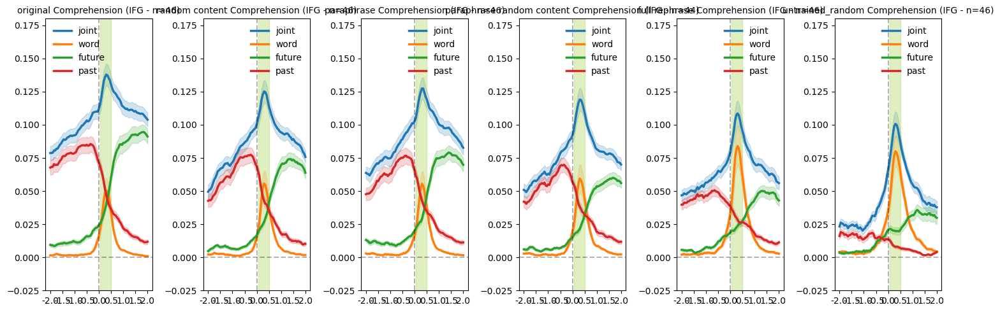

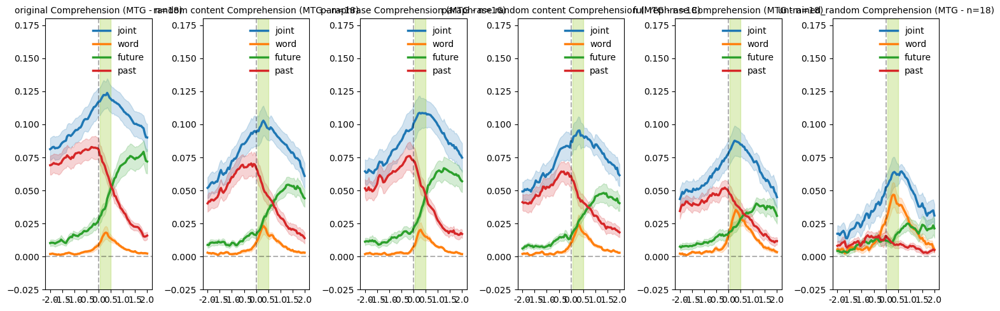

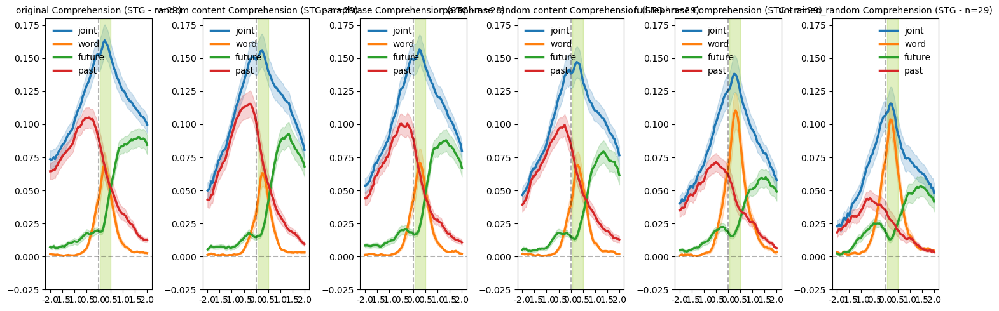

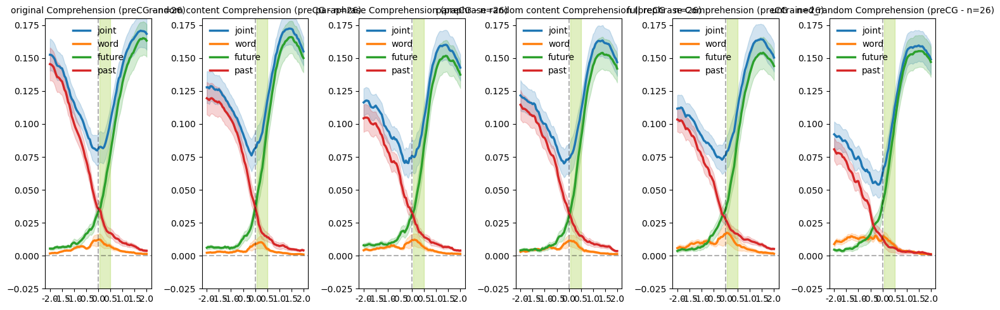

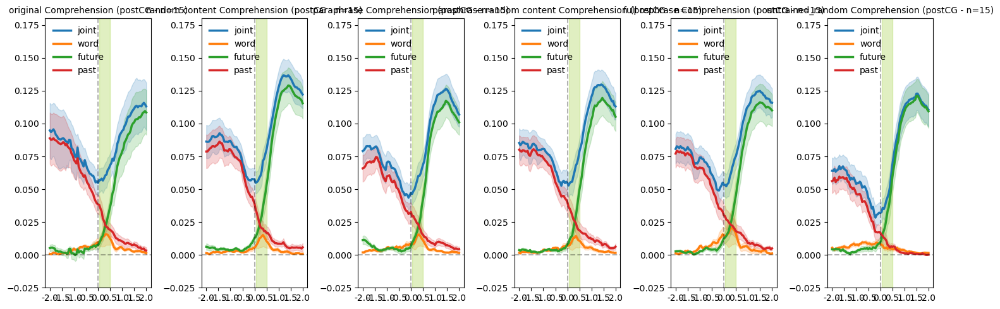

...

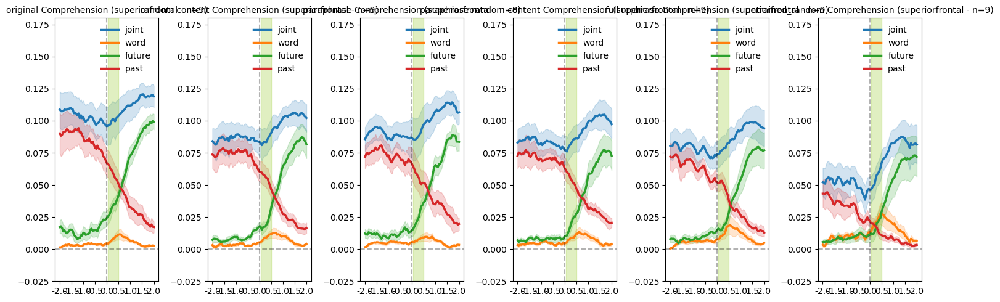

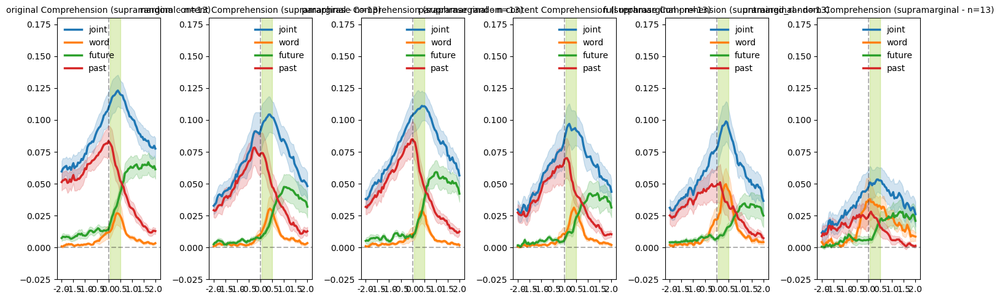

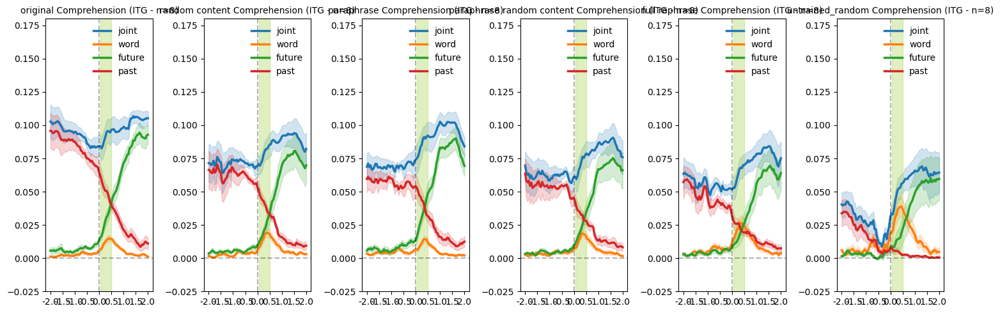

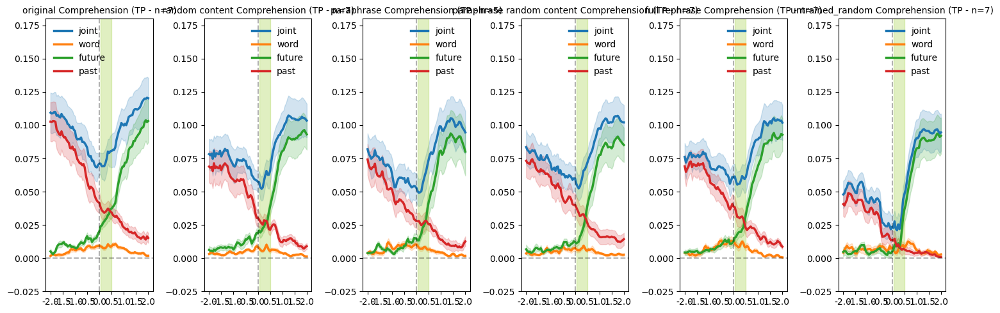

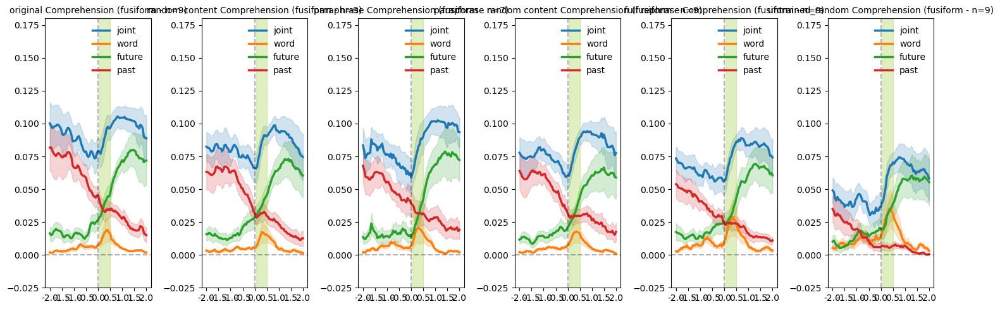

In [6]:
# Process and plot for comprehension (c) DataFrames
rois_to_plot_c = []
for roi in args.rois:
    key = (0, 'joint', roi)
    df = roi_results_c.get(key)
    if df is not None and df.shape[0] > 2:
        rois_to_plot_c.append(roi)

# TODO FIX all of this 
for roi in rois_to_plot_c:
    # Count electrodes in all comprehension datasets for this ROI
    # TODO fix this
    n_elecs_c = next(
    (len(df) for key, df in roi_results_c.items() 
     if key[2] == roi and isinstance(df, pd.DataFrame) and not df.empty), 
    0
    )
    
    if n_elecs_c < 3:
        continue
    # TODO - is it supposed to get dfs or dict? look at orig func in podcast
    pu.plot_single_roi_side_by_side(
        args, 
        roi_results_c, 
        roi, 
        mode="comp", 
        ymax=0.18, 
        save=False, 
        titles=titles
    )

### Comprehension per brainregion

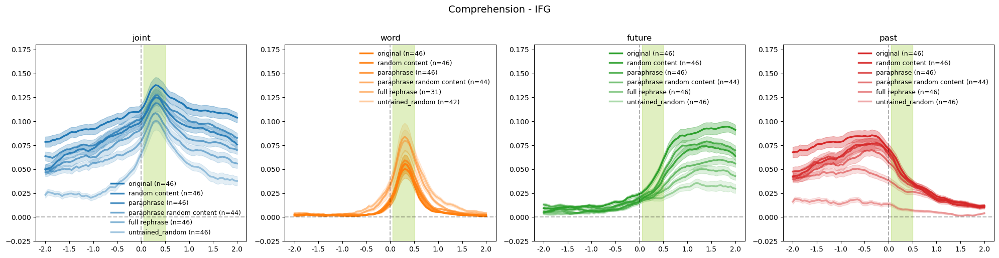

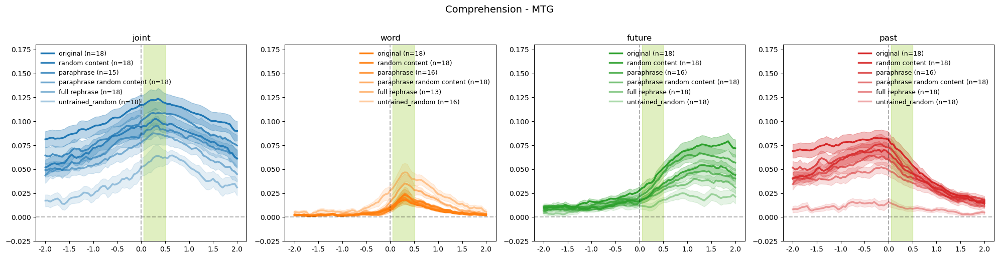

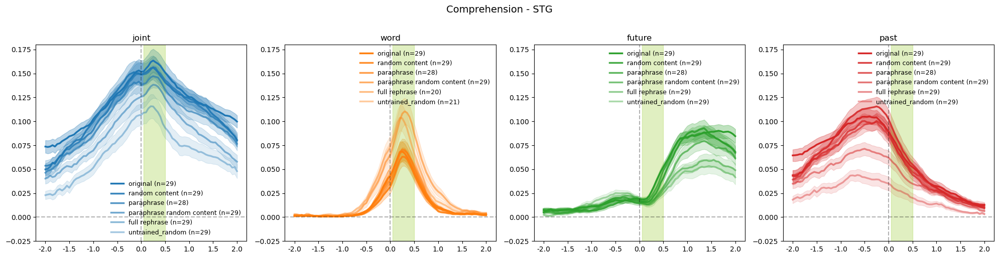

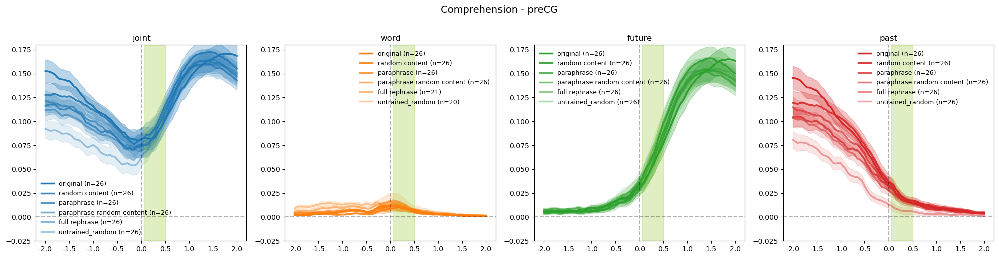

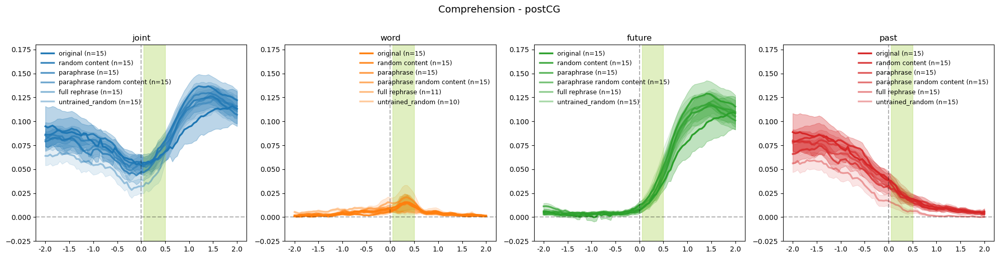

...

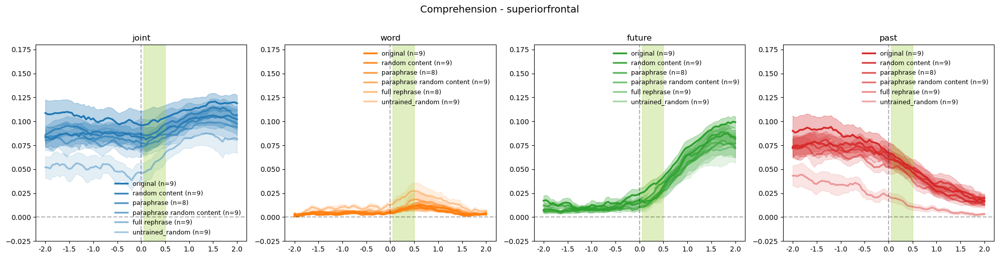

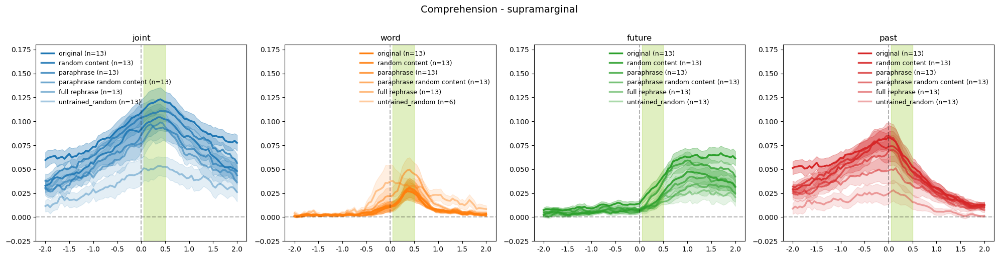

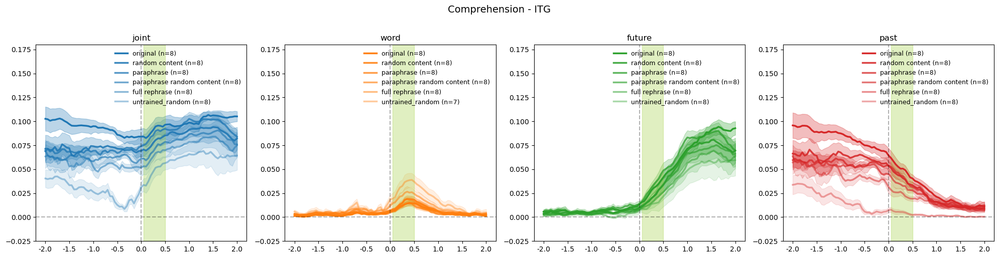

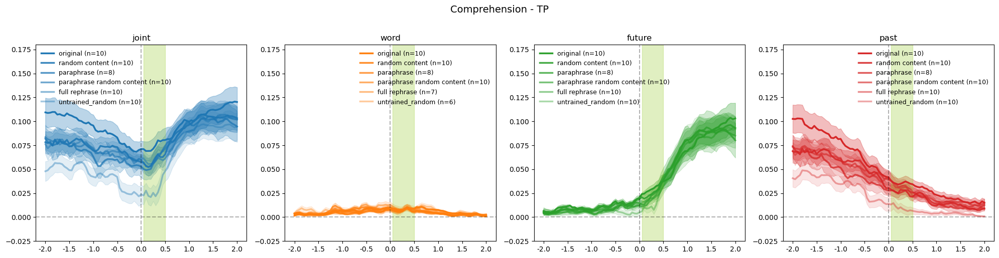

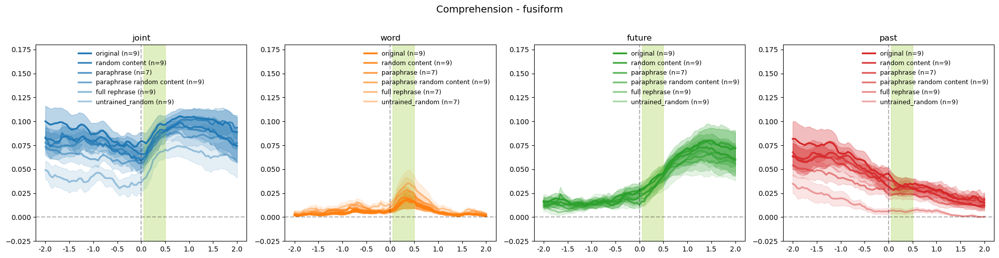

In [8]:
rois_to_plot_c = []
for roi in args.rois:
    key = (0, 'joint', roi)  # Standardized format without _banded_ prefix
    df = roi_results_c.get(key)
    if df is not None and df.shape[0] > 2:
        rois_to_plot_c.append(roi)

    # Count electrodes in all comprehension datasets for this ROI
for roi in rois_to_plot_c:
    n_elecs_c = next(
        (len(df) for key, df in roi_results_c.items() 
         if key[2] == roi and isinstance(df, pd.DataFrame) and not df.empty), 
        0
    )
    
    if n_elecs_c < 3:
        continue
    
    plot_all_lines_across_datasets(
        args, 
        roi_results_c, 
        roi, 
        mode="comp", 
        ymax=0.18, 
        save=False, 
        titles=titles
    )

### Production per brainregion

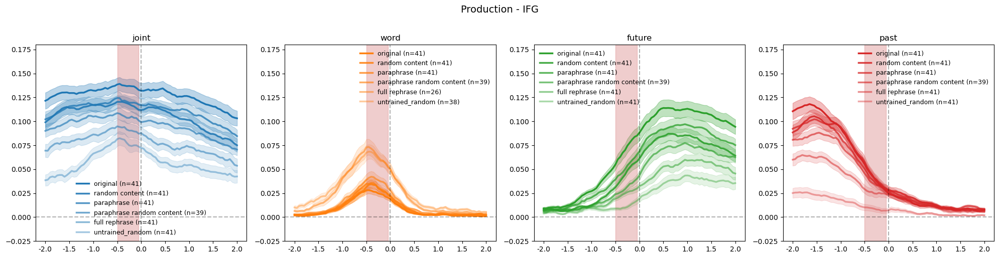

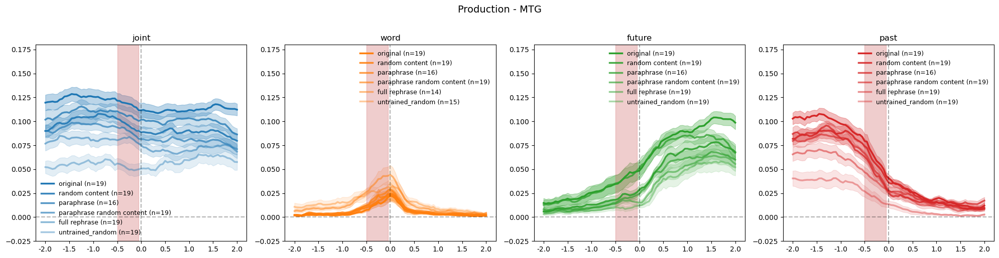

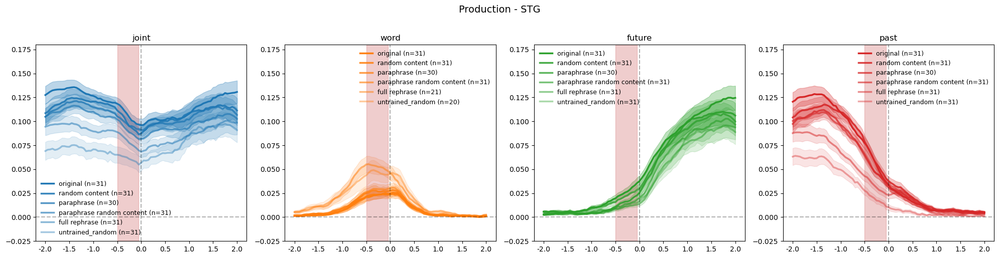

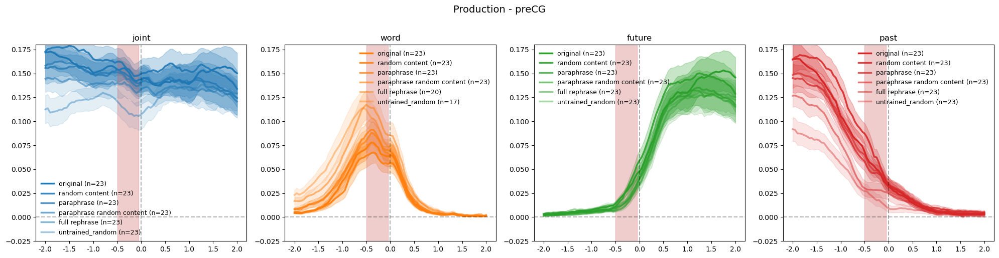

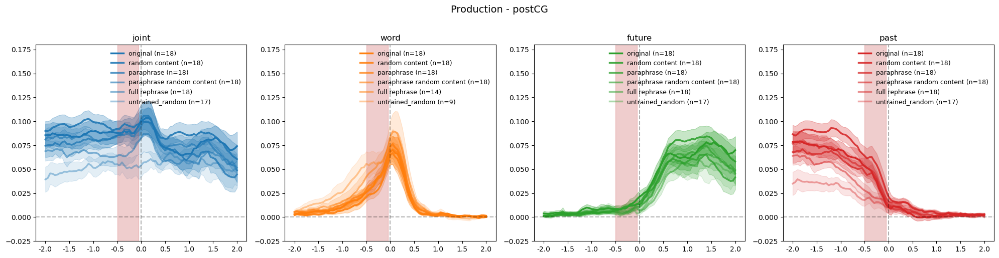

...

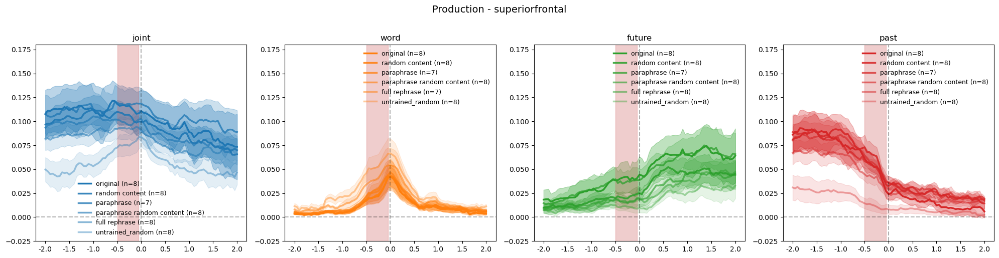

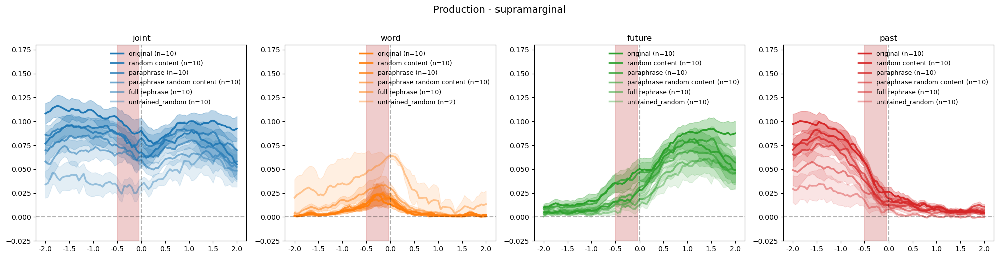

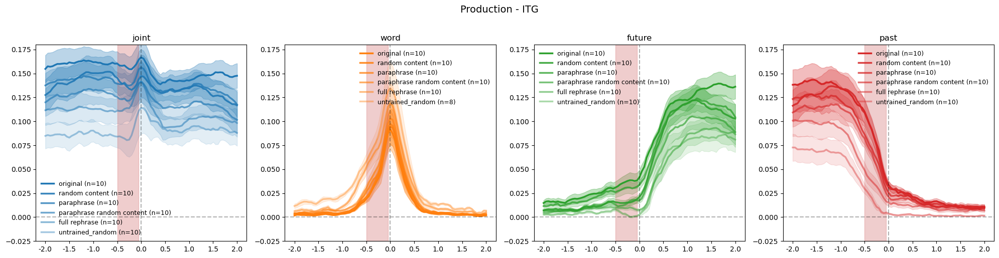

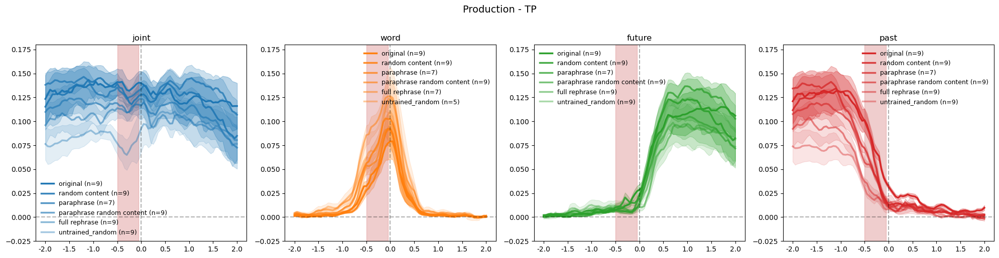

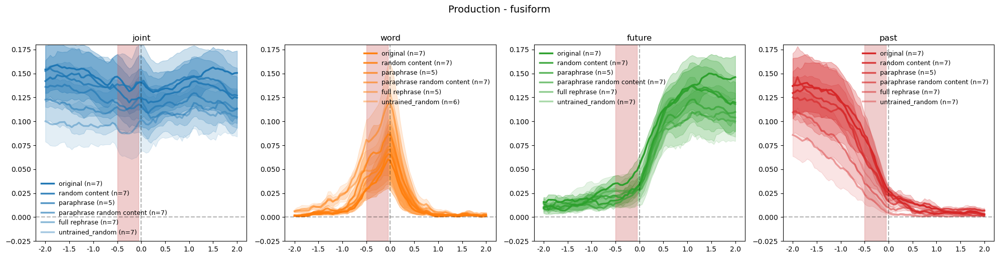

In [15]:
rois_to_plot_p = []
for roi in args.rois:
    key = (0, 'joint', roi)  # Standardized format without _banded_ prefix
    df = roi_results_p.get(key)
    if df is not None and df.shape[0] > 2:
        rois_to_plot_p.append(roi)

for roi in rois_to_plot_p:
    # Count electrodes in all production datasets for this ROI
    n_elecs_p = next(
        (len(df) for key, df in roi_results_p.items() 
         if key[2] == roi and isinstance(df, pd.DataFrame) and not df.empty), 
        0
    )
    
    if n_elecs_p < 3:
        continue
    
    plot_all_lines_across_datasets(
        args, 
        roi_results_p, 
        roi, 
        mode="prod", 
        ymax=0.18, 
        save=False, 
        titles=titles
    )

### Brainplots

In [ ]:
def calc_max_diff_percentile(
    df_control,
    df_reph,
    label3_val,
    time_window_cols,
    percentile=90,
    min_diff=None,
):
    """
    Compute per-electrode max |control - reph| within a lag window.

    If min_diff is not None, electrodes with max_diff < min_diff (or NaN) are excluded.
    """
    results = []

    df_control_filt = df_control[df_control["label3"] == label3_val].copy()
    df_reph_filt    = df_reph[df_reph["label3"] == label3_val].copy()

    # Prefer a stable unique key if present (these result files use subject_electrode)
    if "subject_electrode" in df_control_filt.columns and "subject_electrode" in df_reph_filt.columns:
        merge_keys = ["subject_electrode"]
    elif (
        "subject" in df_control_filt.columns and "subject" in df_reph_filt.columns
        and "electrode" in df_control_filt.columns and "electrode" in df_reph_filt.columns
    ):
        merge_keys = ["subject", "electrode"]
    elif "electrode" in df_control_filt.columns and "electrode" in df_reph_filt.columns:
        merge_keys = ["electrode"]
    else:
        raise KeyError("No common merge key found (expected subject_electrode or subject+electrode or electrode)")

    merged = df_control_filt.merge(
        df_reph_filt,
        on=merge_keys,
        suffixes=("_control", "_reph"),
    )

    if min_diff is not None:
        try:
            min_diff = float(min_diff)
        except (TypeError, ValueError) as exc:
            raise ValueError(f"min_diff must be a number or None, got: {min_diff!r}") from exc

    for _, row in merged.iterrows():
        control_cols = [f"{col}_control" for col in time_window_cols if f"{col}_control" in row.index]
        reph_cols    = [f"{col}_reph" for col in time_window_cols if f"{col}_reph" in row.index]

        control_vals = row[control_cols].to_numpy()
        reph_vals    = row[reph_cols].to_numpy()

        diffs = np.abs(control_vals - reph_vals)

        max_idx = int(np.argmax(diffs)) if len(diffs) else 0
        max_diff = float(np.max(diffs)) if len(diffs) else np.nan
        max_diff_lag = time_window_cols[max_idx] if len(time_window_cols) else np.nan

        # NEW: absolute threshold filter
        if min_diff is not None:
            if (not np.isfinite(max_diff)) or (max_diff < min_diff):
                continue

        subject_electrode = row.get("subject_electrode", np.nan)
        electrode = row.get("electrode_control", row.get("electrode_reph", row.get("electrode", np.nan)))
        roi = row.get("roi_control", row.get("roi_reph", "unknown"))

        # plot_effect_glassbrain expects a 'subject' column
        if pd.notna(subject_electrode):
            subject = str(subject_electrode).split("_", 1)[0]
        else:
            subject = row.get("subject", row.get("subject_control", row.get("subject_reph", np.nan)))

        results.append({
            "subject": subject,
            "subject_electrode": subject_electrode,
            "electrode": electrode,
            "label3": label3_val,
            "max_diff": max_diff,
            "max_diff_lag": max_diff_lag,
            "roi": roi,
        })

    results_df = pd.DataFrame(results)

    # Ensure these exist for all percentiles (concat-friendly)
    results_df["percentile"] = int(percentile)
    results_df["percentile_threshold"] = np.nan
    results_df["above_percentile"] = False

    if len(results_df) > 0 and results_df["max_diff"].notna().any():
        thr = np.percentile(results_df["max_diff"].dropna().to_numpy(), percentile)
        results_df["percentile_threshold"] = thr
        results_df["above_percentile"] = results_df["max_diff"] >= thr

    return results_df


# Define time windows
lag_cols = np.arange(-2000, 2051, 50)
time_window_future_comp = [col for col in lag_cols if col <= 500]
time_window_past_comp   = [col for col in lag_cols if col >= 0]
time_window_future_prod = [col for col in lag_cols if col <= 0]
time_window_past_prod   = [col for col in lag_cols if col >= -500]

#### Paraphrase

In [7]:
lag_cols = np.arange(-2000,2051,50)

for df in [original8_c, original8_p, paraphrase8_c, paraphrase8_p]:
    n_lag_cols = len(df.columns) - 5
    new_columns = list(lag_cols[:n_lag_cols]) + list(df.columns[-5:])
    df.columns = new_columns
# original8_c.columns

percentile=  0 | n electrodes: comp_past=26 prod_future=43


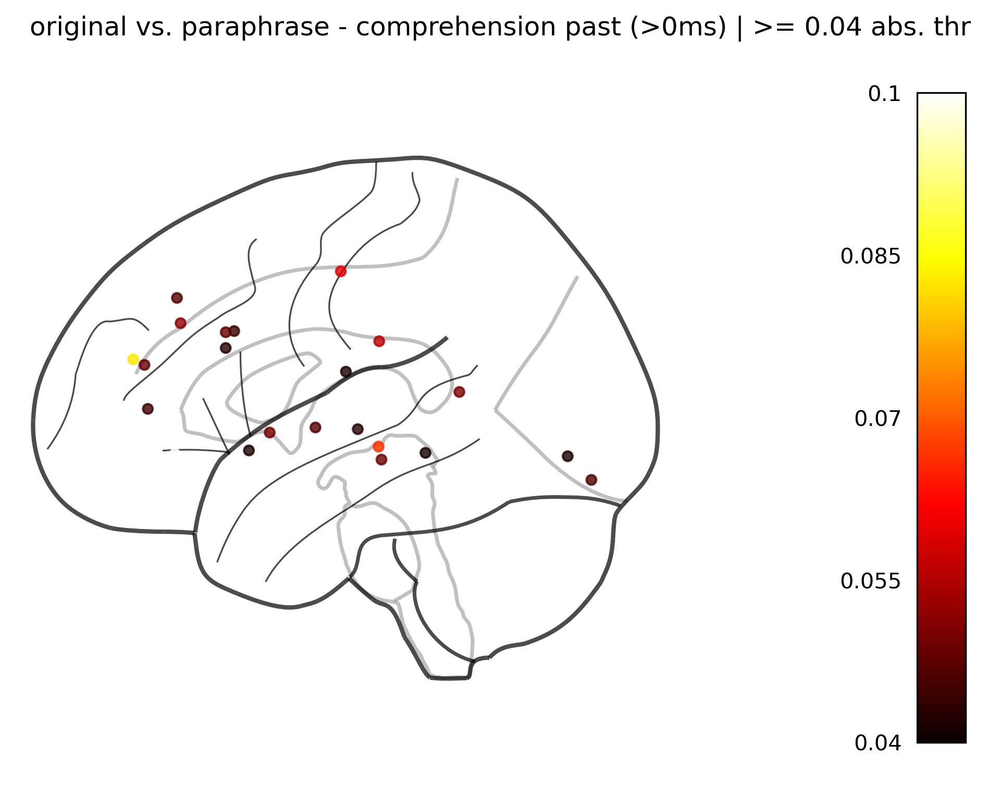

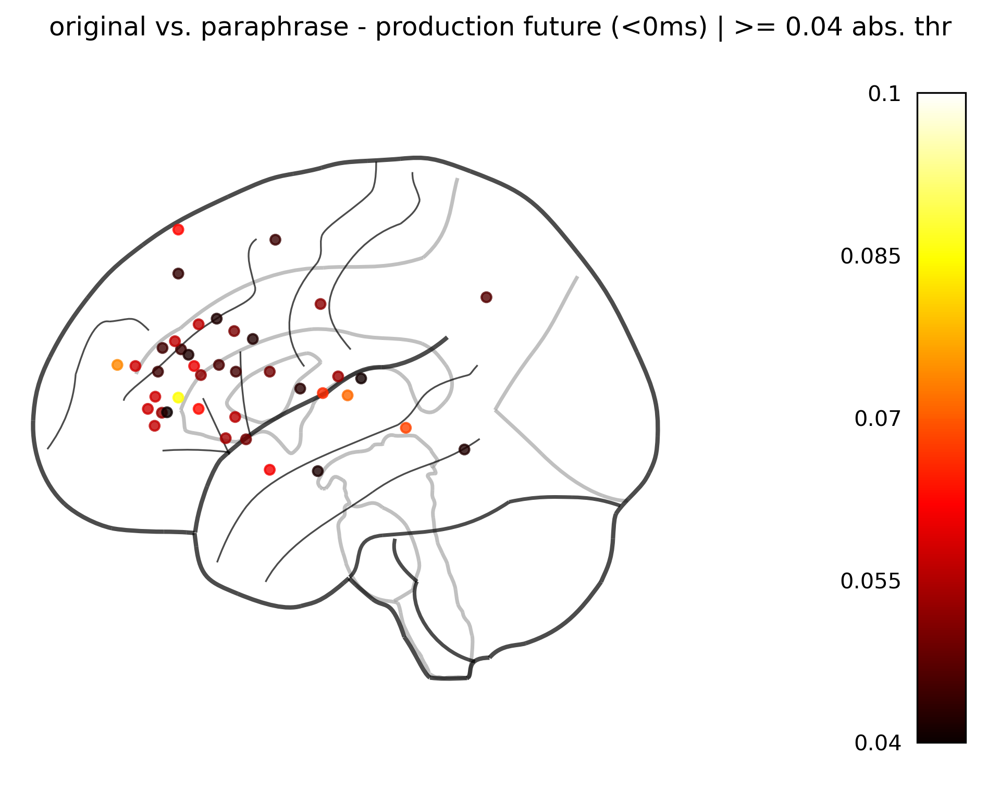

In [9]:
# percentiles = np.arange(0, 91, 10)

MIN_MAX_DIFF = 0.04
percentiles = [0]
all_diffs_list = []
for p in percentiles:
    all_diffs_list.append(calc_max_diff_percentile(original8_c, paraphrase8_c, "sentence",  time_window_future_comp, percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="comp"))
    all_diffs_list.append(calc_max_diff_percentile(original8_c, paraphrase8_c, "sentence2", time_window_past_comp,   percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="comp"))
    all_diffs_list.append(calc_max_diff_percentile(original8_p, paraphrase8_p, "sentence",  time_window_future_prod, percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="prod"))
    all_diffs_list.append(calc_max_diff_percentile(original8_p, paraphrase8_p, "sentence2", time_window_past_prod,   percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="prod"))

all_diffs = pd.concat(all_diffs_list, ignore_index=True)

diffs_past_comp_all   = all_diffs[(all_diffs["mode"] == "comp") & (all_diffs["label3"] == "sentence2")].copy()
diffs_future_prod_all = all_diffs[(all_diffs["mode"] == "prod") & (all_diffs["label3"] == "sentence")].copy()

cmap = "hot"
for p in percentiles:
    diffs_past_comp_f = diffs_past_comp_all[
        (diffs_past_comp_all["percentile"] == p) & (diffs_past_comp_all["above_percentile"])
    ]
    diffs_future_prod_f = diffs_future_prod_all[
        (diffs_future_prod_all["percentile"] == p) & (diffs_future_prod_all["above_percentile"])
    ]

    pu.plot_effect_glassbrain(
        diffs_past_comp_f, cmap=cmap, effect_col="max_diff", vmin=MIN_MAX_DIFF, vmax=0.10,
        # title=f"original vs. paraphrase - production future (<0ms) | >= {p}th pct"
        title=f"original vs. paraphrase - comprehension past (>0ms) | >= {MIN_MAX_DIFF} abs. thr"
    )
    pu.plot_effect_glassbrain(
        diffs_future_prod_f, cmap=cmap, effect_col="max_diff", vmin=MIN_MAX_DIFF, vmax=0.10,
        # title=f"original vs. paraphrase - production future (<0ms) | >= {p}th pct"
        title=f"original vs. paraphrase - production future (<0ms) | >= {MIN_MAX_DIFF} abs. thr"
    )

    print(f"percentile={p:3d} | n electrodes: comp_past={len(diffs_past_comp_f)} prod_future={len(diffs_future_prod_f)}")

#### Random content word

In [12]:
lag_cols = np.arange(-2000,2051,50)

for df in [original8_c, original8_p, random_content_word8_c, random_content_word8_p]:
    n_lag_cols = len(df.columns) - 5
    new_columns = list(lag_cols[:n_lag_cols]) + list(df.columns[-5:])
    df.columns = new_columns
# original8_c.columns

percentile=  0 | n electrodes: comp_past=59 prod_future=89


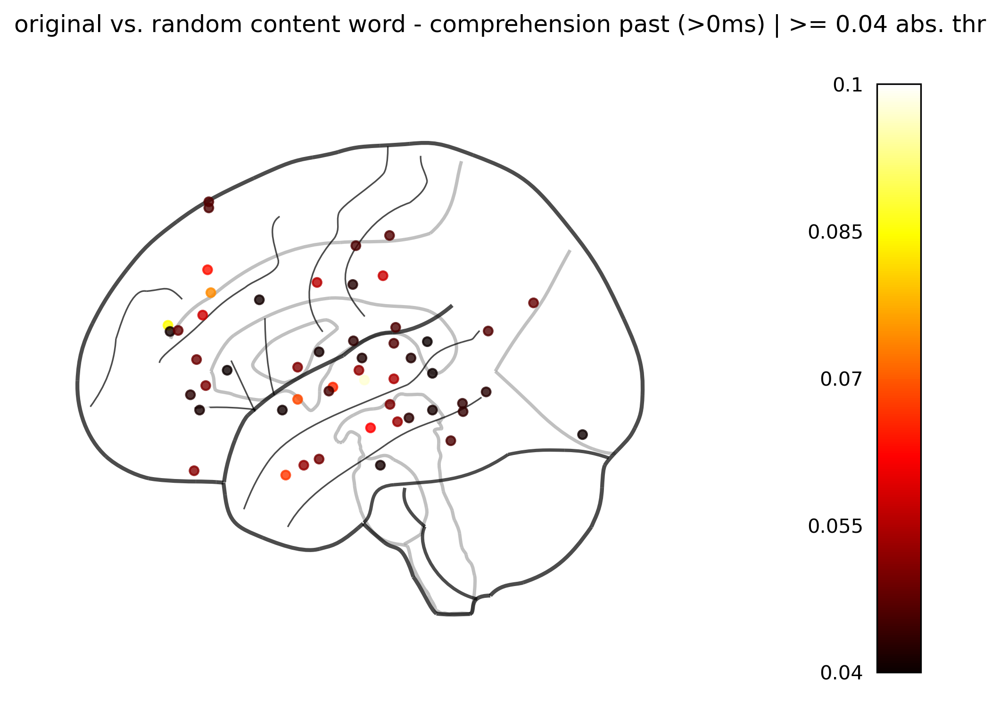

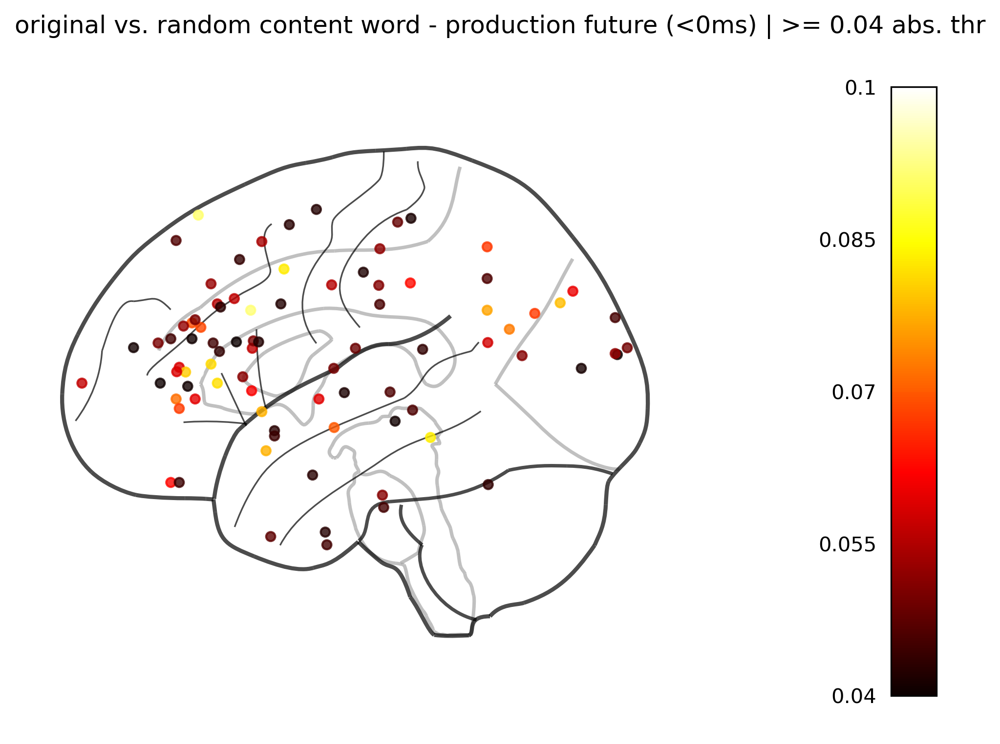

In [13]:
# percentiles = np.arange(0, 91, 10)

MIN_MAX_DIFF = 0.04
percentiles = [0]
all_diffs_list = []
for p in percentiles:
    all_diffs_list.append(calc_max_diff_percentile(original8_c, random_content_word8_c, "sentence",  time_window_future_comp, percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="comp"))
    all_diffs_list.append(calc_max_diff_percentile(original8_c, random_content_word8_c, "sentence2", time_window_past_comp,   percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="comp"))
    all_diffs_list.append(calc_max_diff_percentile(original8_p, random_content_word8_p, "sentence",  time_window_future_prod, percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="prod"))
    all_diffs_list.append(calc_max_diff_percentile(original8_p, random_content_word8_p, "sentence2", time_window_past_prod,   percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="prod"))

all_diffs = pd.concat(all_diffs_list, ignore_index=True)

diffs_past_comp_all   = all_diffs[(all_diffs["mode"] == "comp") & (all_diffs["label3"] == "sentence2")].copy()
diffs_future_prod_all = all_diffs[(all_diffs["mode"] == "prod") & (all_diffs["label3"] == "sentence")].copy()

cmap = "hot"
for p in percentiles:
    diffs_past_comp_f = diffs_past_comp_all[
        (diffs_past_comp_all["percentile"] == p) & (diffs_past_comp_all["above_percentile"])
    ]
    diffs_future_prod_f = diffs_future_prod_all[
        (diffs_future_prod_all["percentile"] == p) & (diffs_future_prod_all["above_percentile"])
    ]

    pu.plot_effect_glassbrain(
        diffs_past_comp_f, cmap=cmap, effect_col="max_diff", vmin=MIN_MAX_DIFF, vmax=0.10,
        # title=f"original vs. paraphrase - production future (<0ms) | >= {p}th pct"
        title=f"original vs. random content word - comprehension past (>0ms) | >= {MIN_MAX_DIFF} abs. thr"
    )
    pu.plot_effect_glassbrain(
        diffs_future_prod_f, cmap=cmap, effect_col="max_diff", vmin=MIN_MAX_DIFF, vmax=0.10,
        # title=f"original vs. paraphrase - production future (<0ms) | >= {p}th pct"
        title=f"original vs. random content word - production future (<0ms) | >= {MIN_MAX_DIFF} abs. thr"
    )

    print(f"percentile={p:3d} | n electrodes: comp_past={len(diffs_past_comp_f)} prod_future={len(diffs_future_prod_f)}")

#### Paraphrase vs random content word


In [ ]:
lag_cols = np.arange(-2000,2051,50)

for df in [random_content_word8_c, random_content_word8_p, paraphrase8_c, paraphrase8_p]:
    n_lag_cols = len(df.columns) - 5
    new_columns = list(lag_cols[:n_lag_cols]) + list(df.columns[-5:])
    df.columns = new_columns

percentile=  0 | n electrodes: comp_past=43 prod_future=70


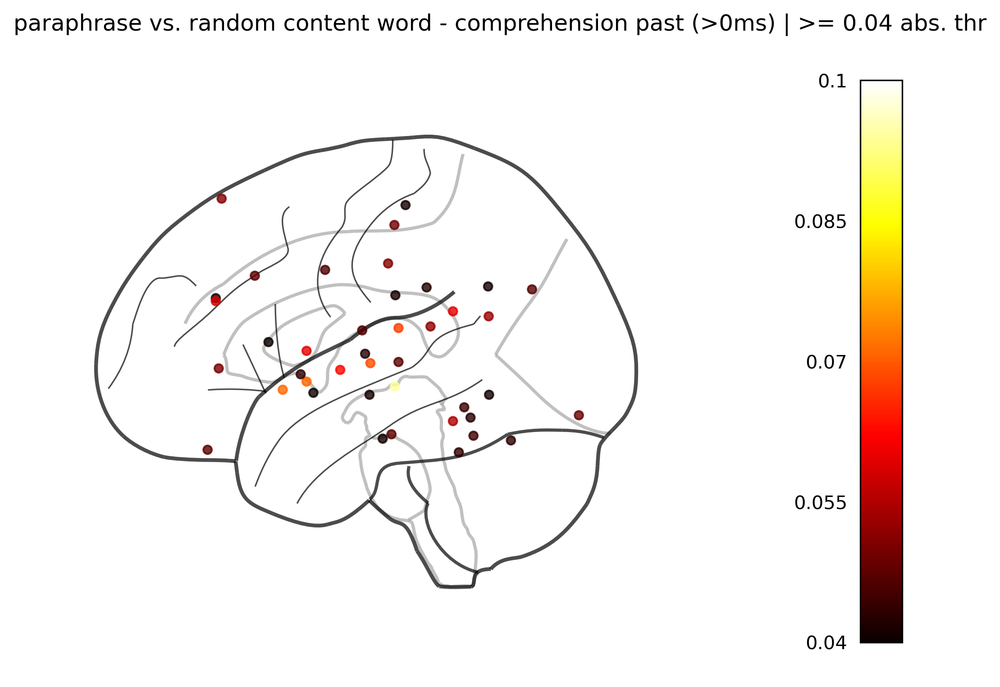

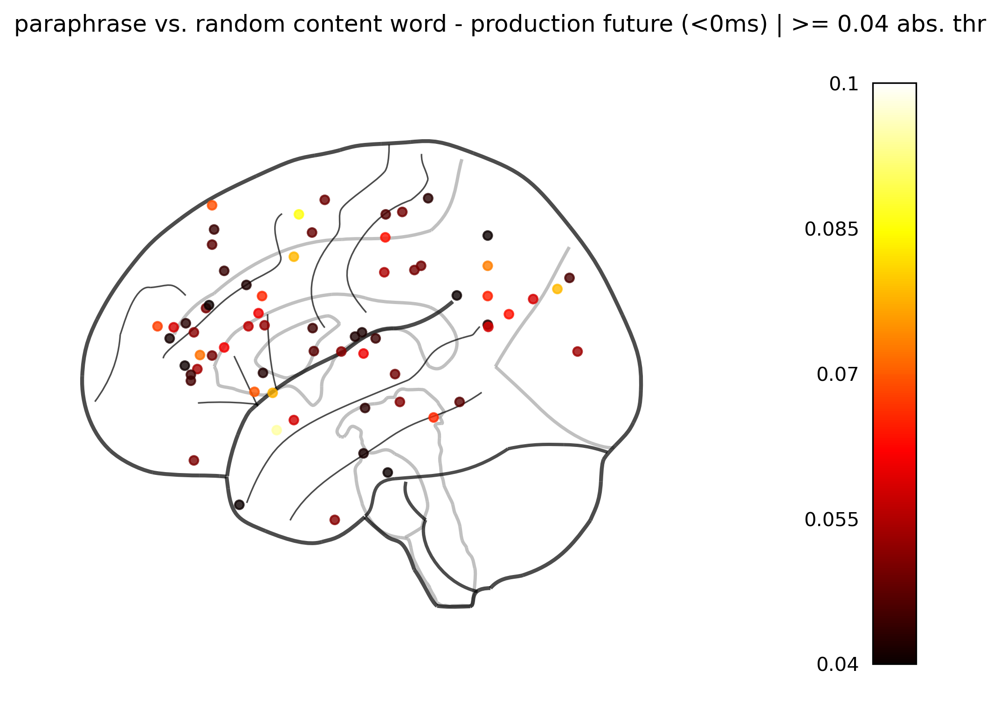

In [15]:
# percentiles = np.arange(0, 91, 10)

MIN_MAX_DIFF = 0.04
percentiles = [0]
all_diffs_list = []
for p in percentiles:
    all_diffs_list.append(calc_max_diff_percentile(paraphrase8_c, random_content_word8_c, "sentence",  time_window_future_comp, percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="comp"))
    all_diffs_list.append(calc_max_diff_percentile(paraphrase8_c, random_content_word8_c, "sentence2", time_window_past_comp,   percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="comp"))
    all_diffs_list.append(calc_max_diff_percentile(paraphrase8_p, random_content_word8_p, "sentence",  time_window_future_prod, percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="prod"))
    all_diffs_list.append(calc_max_diff_percentile(paraphrase8_p, random_content_word8_p, "sentence2", time_window_past_prod,   percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="prod"))

all_diffs = pd.concat(all_diffs_list, ignore_index=True)

diffs_past_comp_all   = all_diffs[(all_diffs["mode"] == "comp") & (all_diffs["label3"] == "sentence2")].copy()
diffs_future_prod_all = all_diffs[(all_diffs["mode"] == "prod") & (all_diffs["label3"] == "sentence")].copy()

cmap = "hot"
for p in percentiles:
    diffs_past_comp_f = diffs_past_comp_all[
        (diffs_past_comp_all["percentile"] == p) & (diffs_past_comp_all["above_percentile"])
    ]
    diffs_future_prod_f = diffs_future_prod_all[
        (diffs_future_prod_all["percentile"] == p) & (diffs_future_prod_all["above_percentile"])
    ]

    pu.plot_effect_glassbrain(
        diffs_past_comp_f, cmap=cmap, effect_col="max_diff", vmin=MIN_MAX_DIFF, vmax=0.10,
        # title=f"original vs. paraphrase - production future (<0ms) | >= {p}th pct"
        title=f"paraphrase vs. random content word - comprehension past (>0ms) | >= {MIN_MAX_DIFF} abs. thr"
    )
    pu.plot_effect_glassbrain(
        diffs_future_prod_f, cmap=cmap, effect_col="max_diff", vmin=MIN_MAX_DIFF, vmax=0.10,
        # title=f"original vs. paraphrase - production future (<0ms) | >= {p}th pct"
        title=f"paraphrase vs. random content word - production future (<0ms) | >= {MIN_MAX_DIFF} abs. thr"
    )

    print(f"percentile={p:3d} | n electrodes: comp_past={len(diffs_past_comp_f)} prod_future={len(diffs_future_prod_f)}")

### Original vs rand reph

In [16]:
lag_cols = np.arange(-2000,2051,50)

for df in [full_reph_c8, full_reph_p8, original8_c, original8_p]:
    n_lag_cols = len(df.columns) - 5
    new_columns = list(lag_cols[:n_lag_cols]) + list(df.columns[-5:])
    df.columns = new_columns

percentile=  0 | n electrodes: comp_past=148 prod_future=147


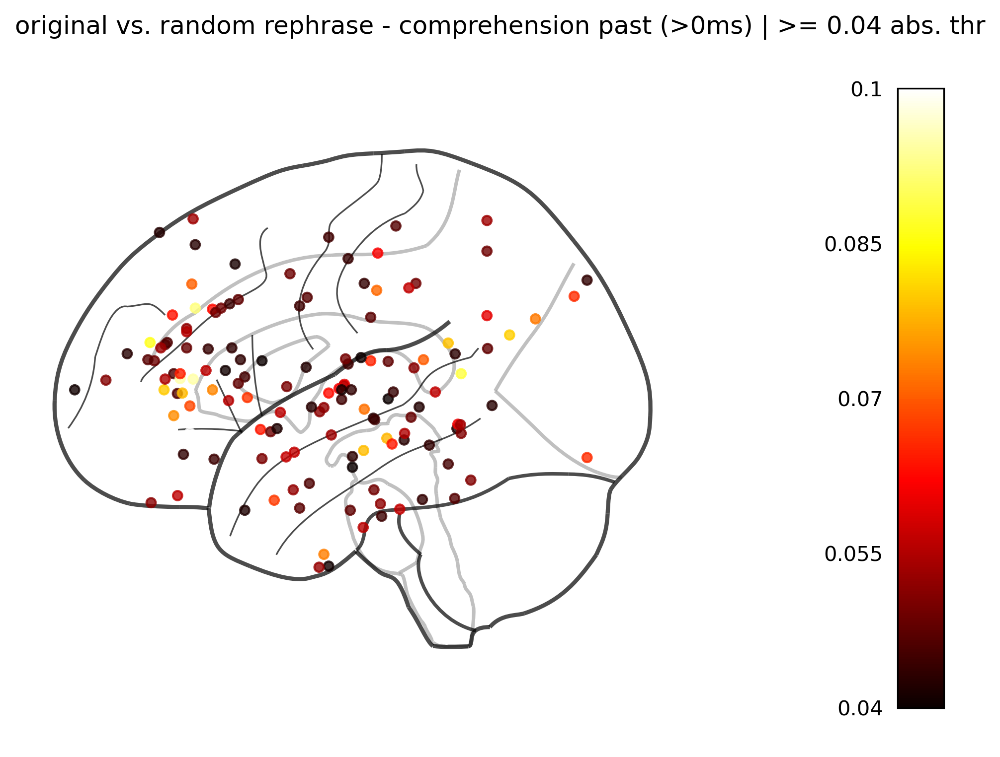

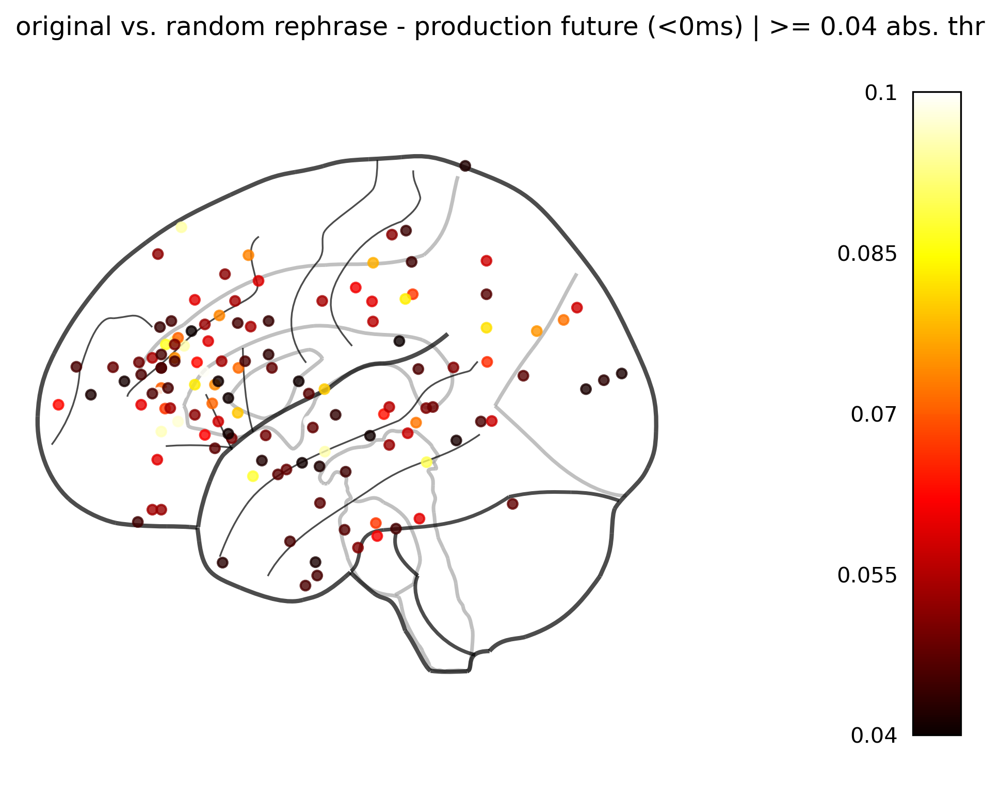

In [17]:
# percentiles = np.arange(0, 91, 10)

MIN_MAX_DIFF = 0.04
percentiles = [0]
all_diffs_list = []
for p in percentiles:
    all_diffs_list.append(calc_max_diff_percentile(original8_c, full_reph_c8, "sentence",  time_window_future_comp, percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="comp"))
    all_diffs_list.append(calc_max_diff_percentile(original8_c, full_reph_c8, "sentence2", time_window_past_comp,   percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="comp"))
    all_diffs_list.append(calc_max_diff_percentile(original8_p, full_reph_p8, "sentence",  time_window_future_prod, percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="prod"))
    all_diffs_list.append(calc_max_diff_percentile(original8_p, full_reph_p8, "sentence2", time_window_past_prod,   percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="prod"))

all_diffs = pd.concat(all_diffs_list, ignore_index=True)

diffs_past_comp_all   = all_diffs[(all_diffs["mode"] == "comp") & (all_diffs["label3"] == "sentence2")].copy()
diffs_future_prod_all = all_diffs[(all_diffs["mode"] == "prod") & (all_diffs["label3"] == "sentence")].copy()

cmap = "hot"
for p in percentiles:
    diffs_past_comp_f = diffs_past_comp_all[
        (diffs_past_comp_all["percentile"] == p) & (diffs_past_comp_all["above_percentile"])
    ]
    diffs_future_prod_f = diffs_future_prod_all[
        (diffs_future_prod_all["percentile"] == p) & (diffs_future_prod_all["above_percentile"])
    ]

    pu.plot_effect_glassbrain(
        diffs_past_comp_f, cmap=cmap, effect_col="max_diff", vmin=MIN_MAX_DIFF, vmax=0.10,
        # title=f"original vs. paraphrase - production future (<0ms) | >= {p}th pct"
        title=f"original vs. random rephrase - comprehension past (>0ms) | >= {MIN_MAX_DIFF} abs. thr"
    )
    pu.plot_effect_glassbrain(
        diffs_future_prod_f, cmap=cmap, effect_col="max_diff", vmin=MIN_MAX_DIFF, vmax=0.10,
        # title=f"original vs. paraphrase - production future (<0ms) | >= {p}th pct"
        title=f"original vs. random rephrase - production future (<0ms) | >= {MIN_MAX_DIFF} abs. thr"
    )

    print(f"percentile={p:3d} | n electrodes: comp_past={len(diffs_past_comp_f)} prod_future={len(diffs_future_prod_f)}")

### Paraphrase vs paraphrase+random content words

percentile=  0 | n electrodes: comp_past=35 prod_future=66


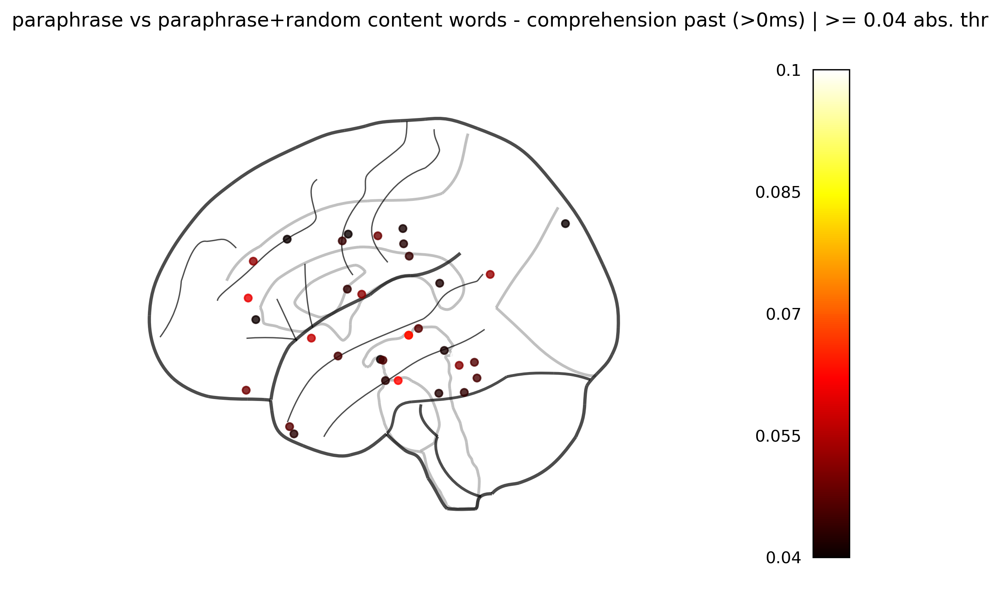

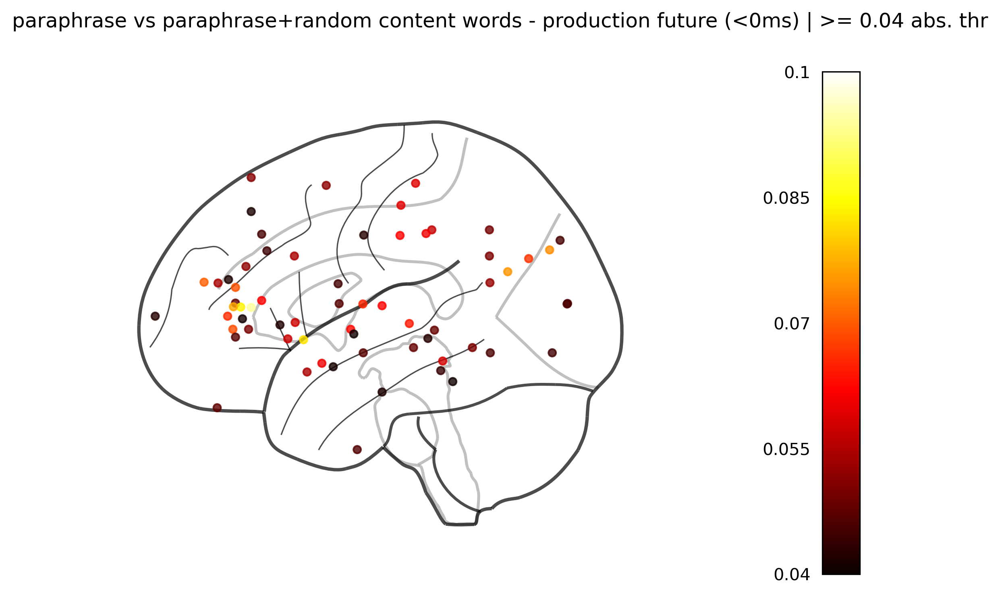

In [21]:
lag_cols = np.arange(-2000,2051,50)

for df in [parandom8_c, parandom8_p, paraphrase8_c, paraphrase8_p]:
    n_lag_cols = len(df.columns) - 5
    new_columns = list(lag_cols[:n_lag_cols]) + list(df.columns[-5:])
    df.columns = new_columns
# original8_c.columns

# percentiles = np.arange(0, 91, 10)

MIN_MAX_DIFF = 0.04
percentiles = [0]
all_diffs_list = []
for p in percentiles:
    all_diffs_list.append(calc_max_diff_percentile(parandom8_c, paraphrase8_c, "sentence",  time_window_future_comp, percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="comp"))
    all_diffs_list.append(calc_max_diff_percentile(parandom8_c, paraphrase8_c, "sentence2", time_window_past_comp,   percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="comp"))
    all_diffs_list.append(calc_max_diff_percentile(parandom8_p, paraphrase8_p, "sentence",  time_window_future_prod, percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="prod"))
    all_diffs_list.append(calc_max_diff_percentile(parandom8_p, paraphrase8_p, "sentence2", time_window_past_prod,   percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="prod"))

all_diffs = pd.concat(all_diffs_list, ignore_index=True)

diffs_past_comp_all   = all_diffs[(all_diffs["mode"] == "comp") & (all_diffs["label3"] == "sentence2")].copy()
diffs_future_prod_all = all_diffs[(all_diffs["mode"] == "prod") & (all_diffs["label3"] == "sentence")].copy()

cmap = "hot"
for p in percentiles:
    diffs_past_comp_f = diffs_past_comp_all[
        (diffs_past_comp_all["percentile"] == p) & (diffs_past_comp_all["above_percentile"])
    ]
    diffs_future_prod_f = diffs_future_prod_all[
        (diffs_future_prod_all["percentile"] == p) & (diffs_future_prod_all["above_percentile"])
    ]

    pu.plot_effect_glassbrain(
        diffs_past_comp_f, cmap=cmap, effect_col="max_diff", vmin=MIN_MAX_DIFF, vmax=0.10,
        # title=f"original vs. paraphrase - production future (<0ms) | >= {p}th pct"
        title=f"paraphrase vs paraphrase+random content words - comprehension past (>0ms) | >= {MIN_MAX_DIFF} abs. thr"
    )
    pu.plot_effect_glassbrain(
        diffs_future_prod_f, cmap=cmap, effect_col="max_diff", vmin=MIN_MAX_DIFF, vmax=0.10,
        # title=f"original vs. paraphrase - production future (<0ms) | >= {p}th pct"
        title=f"paraphrase vs paraphrase+random content words - production future (<0ms) | >= {MIN_MAX_DIFF} abs. thr"
    )

    print(f"percentile={p:3d} | n electrodes: comp_past={len(diffs_past_comp_f)} prod_future={len(diffs_future_prod_f)}")

### Original vs rephrase + random content words

percentile=  0 | n electrodes: comp_past=71 prod_future=113


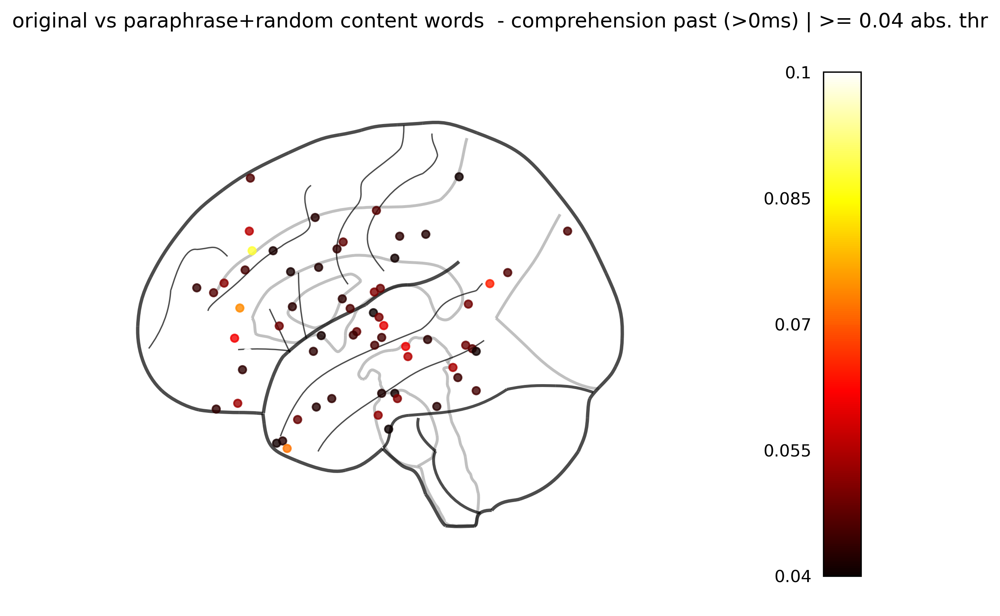

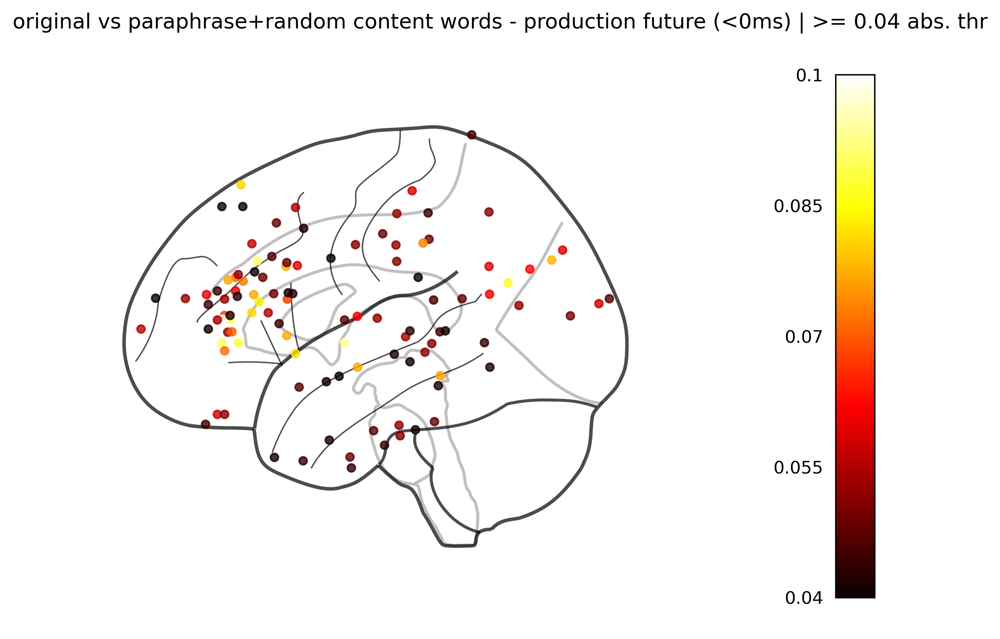

In [20]:
lag_cols = np.arange(-2000,2051,50)

for df in [parandom8_c, parandom8_p, original8_c, original8_p]:
    n_lag_cols = len(df.columns) - 5
    new_columns = list(lag_cols[:n_lag_cols]) + list(df.columns[-5:])
    df.columns = new_columns
# original8_c.columns

# percentiles = np.arange(0, 91, 10)

MIN_MAX_DIFF = 0.04
percentiles = [0]
all_diffs_list = []
for p in percentiles:
    all_diffs_list.append(calc_max_diff_percentile(parandom8_c, original8_c, "sentence",  time_window_future_comp, percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="comp"))
    all_diffs_list.append(calc_max_diff_percentile(parandom8_c, original8_c, "sentence2", time_window_past_comp,   percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="comp"))
    all_diffs_list.append(calc_max_diff_percentile(parandom8_p, original8_p, "sentence",  time_window_future_prod, percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="prod"))
    all_diffs_list.append(calc_max_diff_percentile(parandom8_p, original8_p, "sentence2", time_window_past_prod,   percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="prod"))

all_diffs = pd.concat(all_diffs_list, ignore_index=True)

diffs_past_comp_all   = all_diffs[(all_diffs["mode"] == "comp") & (all_diffs["label3"] == "sentence2")].copy()
diffs_future_prod_all = all_diffs[(all_diffs["mode"] == "prod") & (all_diffs["label3"] == "sentence")].copy()

cmap = "hot"
for p in percentiles:
    diffs_past_comp_f = diffs_past_comp_all[
        (diffs_past_comp_all["percentile"] == p) & (diffs_past_comp_all["above_percentile"])
    ]
    diffs_future_prod_f = diffs_future_prod_all[
        (diffs_future_prod_all["percentile"] == p) & (diffs_future_prod_all["above_percentile"])
    ]

    pu.plot_effect_glassbrain(
        diffs_past_comp_f, cmap=cmap, effect_col="max_diff", vmin=MIN_MAX_DIFF, vmax=0.10,
        # title=f"original vs. paraphrase - production future (<0ms) | >= {p}th pct"
        title=f"original vs paraphrase+random content words  - comprehension past (>0ms) | >= {MIN_MAX_DIFF} abs. thr"
    )
    pu.plot_effect_glassbrain(
        diffs_future_prod_f, cmap=cmap, effect_col="max_diff", vmin=MIN_MAX_DIFF, vmax=0.10,
        # title=f"original vs. paraphrase - production future (<0ms) | >= {p}th pct"
        title=f"original vs paraphrase+random content words - production future (<0ms) | >= {MIN_MAX_DIFF} abs. thr"
    )

    print(f"percentile={p:3d} | n electrodes: comp_past={len(diffs_past_comp_f)} prod_future={len(diffs_future_prod_f)}")

percentile=  0 | n electrodes: comp_past=29 prod_future=28


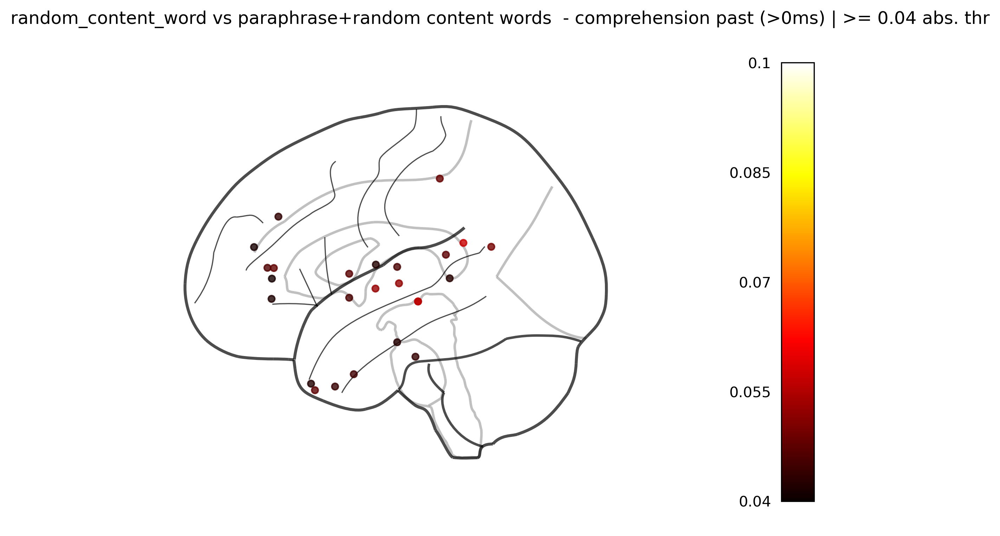

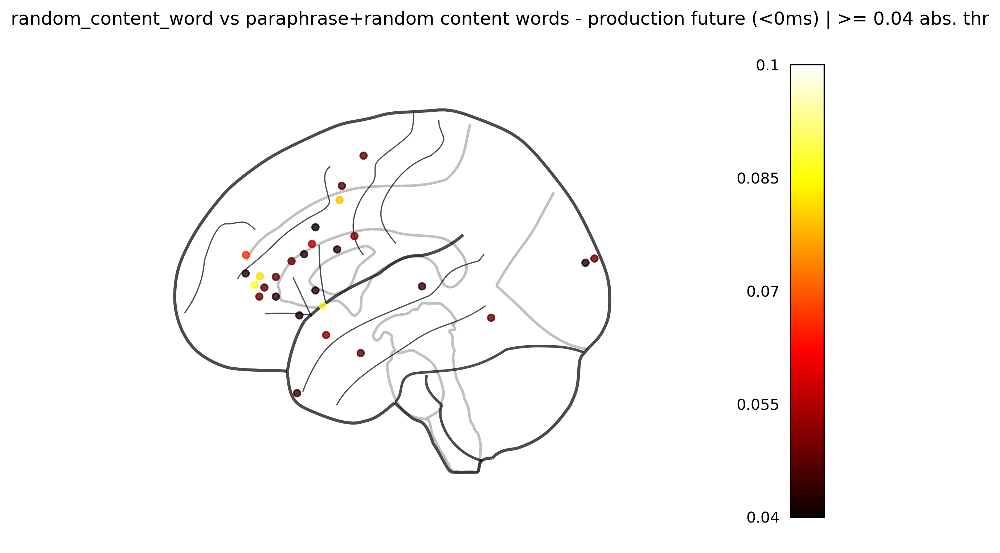

In [23]:
lag_cols = np.arange(-2000,2051,50)

for df in [parandom8_c, parandom8_p, random_content_word8_c, random_content_word8_p]:
    n_lag_cols = len(df.columns) - 5
    new_columns = list(lag_cols[:n_lag_cols]) + list(df.columns[-5:])
    df.columns = new_columns
# original8_c.columns

# percentiles = np.arange(0, 91, 10)

MIN_MAX_DIFF = 0.04
percentiles = [0]
all_diffs_list = []
for p in percentiles:
    all_diffs_list.append(calc_max_diff_percentile(parandom8_c, random_content_word8_c, "sentence",  time_window_future_comp, percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="comp"))
    all_diffs_list.append(calc_max_diff_percentile(parandom8_c, random_content_word8_c, "sentence2", time_window_past_comp,   percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="comp"))
    all_diffs_list.append(calc_max_diff_percentile(parandom8_p, random_content_word8_p, "sentence",  time_window_future_prod, percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="prod"))
    all_diffs_list.append(calc_max_diff_percentile(parandom8_p, random_content_word8_p, "sentence2", time_window_past_prod,   percentile=p, min_diff=MIN_MAX_DIFF).assign(mode="prod"))

all_diffs = pd.concat(all_diffs_list, ignore_index=True)

diffs_past_comp_all   = all_diffs[(all_diffs["mode"] == "comp") & (all_diffs["label3"] == "sentence2")].copy()
diffs_future_prod_all = all_diffs[(all_diffs["mode"] == "prod") & (all_diffs["label3"] == "sentence")].copy()

cmap = "hot"
for p in percentiles:
    diffs_past_comp_f = diffs_past_comp_all[
        (diffs_past_comp_all["percentile"] == p) & (diffs_past_comp_all["above_percentile"])
    ]
    diffs_future_prod_f = diffs_future_prod_all[
        (diffs_future_prod_all["percentile"] == p) & (diffs_future_prod_all["above_percentile"])
    ]

    pu.plot_effect_glassbrain(
        diffs_past_comp_f, cmap=cmap, effect_col="max_diff", vmin=MIN_MAX_DIFF, vmax=0.10,
        # title=f"original vs. paraphrase - production future (<0ms) | >= {p}th pct"
        title=f"random_content_word vs paraphrase+random content words  - comprehension past (>0ms) | >= {MIN_MAX_DIFF} abs. thr"
    )
    pu.plot_effect_glassbrain(
        diffs_future_prod_f, cmap=cmap, effect_col="max_diff", vmin=MIN_MAX_DIFF, vmax=0.10,
        # title=f"original vs. paraphrase - production future (<0ms) | >= {p}th pct"
        title=f"random_content_word vs paraphrase+random content words - production future (<0ms) | >= {MIN_MAX_DIFF} abs. thr"
    )

    print(f"percentile={p:3d} | n electrodes: comp_past={len(diffs_past_comp_f)} prod_future={len(diffs_future_prod_f)}")

## Directional brainplots

In [ ]:
lag_cols = np.arange(-2000,2051,50)

for df in [random_content_word8_c, random_content_word8_p, paraphrase8_c, paraphrase8_p]:
    n_lag_cols = len(df.columns) - 5
    new_columns = list(lag_cols[:n_lag_cols]) + list(df.columns[-5:])
    df.columns = new_columns

<Axes: title={'center': 'Directional Difference, comprehension: Random content word vs Paraphrase'}>

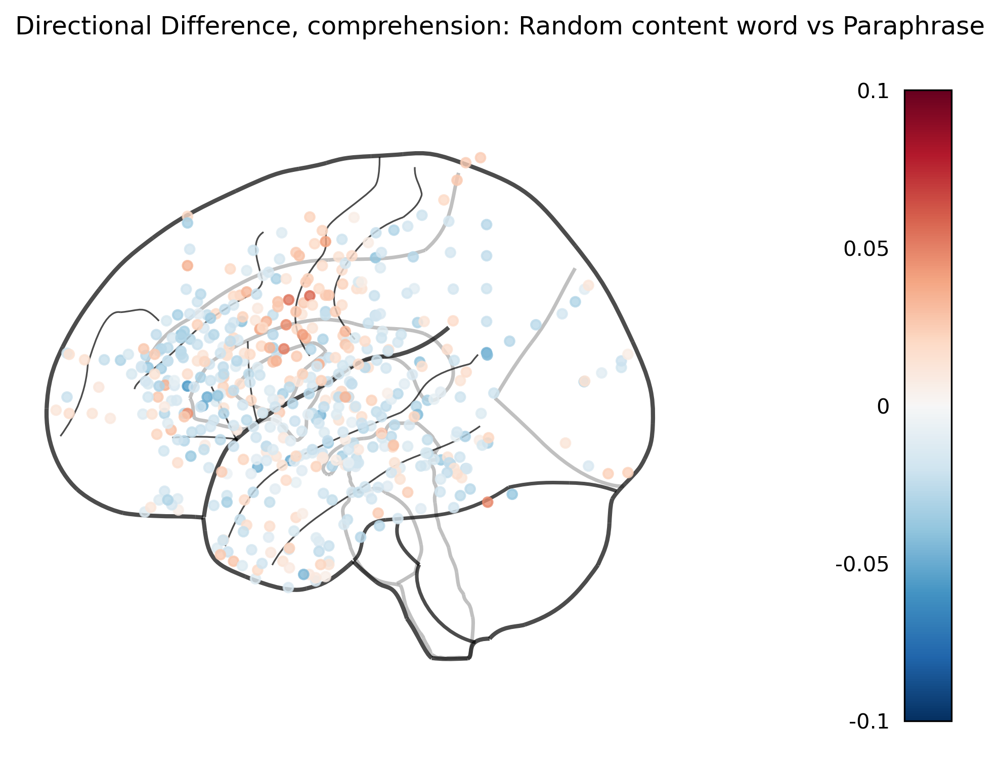

In [ ]:
# Import the directional function
from tfsplt_directional_diff import calc_max_diff_directional

# Use exactly like calc_max_diff_percentile, but with min_abs_diff instead of min_diff
diffs_dir = calc_max_diff_directional(
    random_content_word8_c, 
    paraphrase8_c, 
    "sentence2", 
    time_window_future_comp,
    percentile=0,
    min_abs_diff=0.00  # Filter by absolute magnitude, keep sign
)

# Plot with diverging colormap
pu.plot_effect_glassbrain(
    diffs_dir,
    cmap="RdBu_r",  # Red=random content words better, Blue=paraphrase better
    effect_col="max_diff",
    vmin=-0.10,  # Symmetric limits for diverging colormap
    vmax=0.10,
    title="Directional Difference, comprehension: Random content word vs Paraphrase"
)

<Axes: title={'center': 'Directional Difference, production: Random content word vs Paraphrase'}>

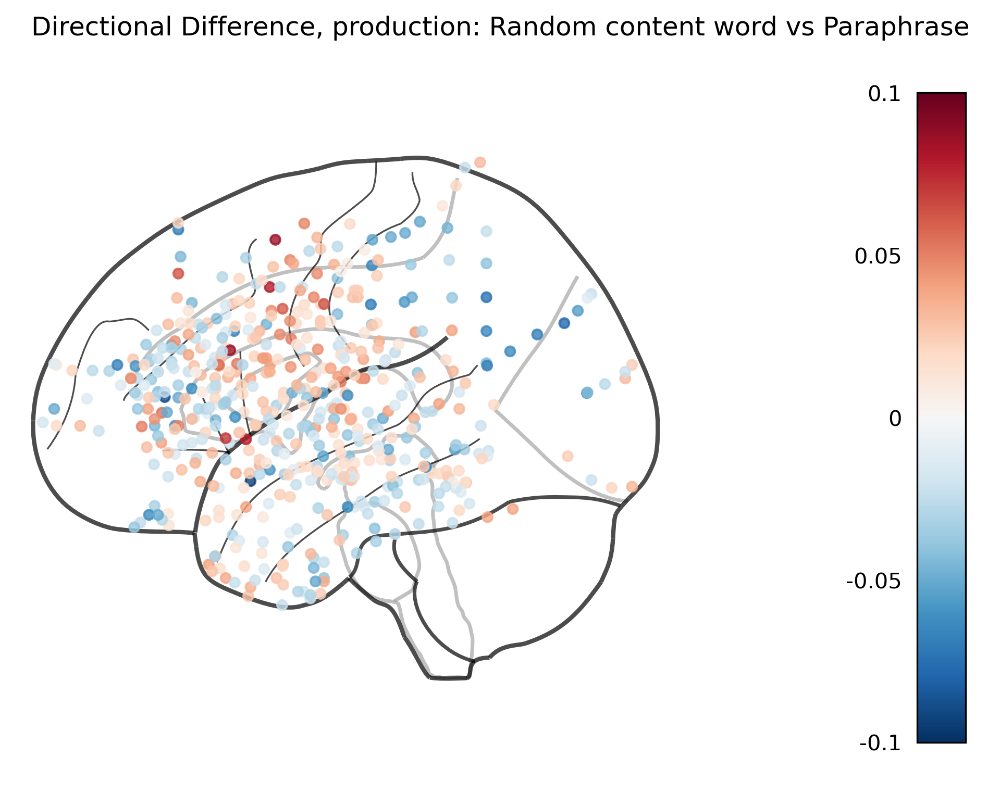

In [ ]:
# Import the directional function
from tfsplt_directional_diff import calc_max_diff_directional

# Use exactly like calc_max_diff_percentile, but with min_abs_diff instead of min_diff
diffs_dir = calc_max_diff_directional(
    random_content_word8_p, 
    paraphrase8_p, 
    "joint", 
    time_window_future_comp,
    percentile=0,
    min_abs_diff=0.00  # Filter by absolute magnitude, keep sign
)

# Plot with diverging colormap
pu.plot_effect_glassbrain(
    diffs_dir,
    cmap="RdBu_r",  # Red=random content words better, Blue=paraphrase better
    effect_col="max_diff",
    vmin=-0.10,  # Symmetric limits for diverging colormap
    vmax=0.10,
    title="Directional Difference, production: Random content word vs Paraphrase"
)

### Draft statistical analysis

In [ ]:
from scipy import stats

def benjamini_hochberg(p_values, alpha=0.05):
    """Simple Benjamini-Hochberg FDR correction"""
    n = len(p_values)
    sorted_indices = np.argsort(p_values)
    sorted_pvals = p_values[sorted_indices]
    
    # Adjusted p-values
    adjusted = np.zeros(n)
    adjusted[sorted_indices] = sorted_pvals * n / (np.arange(n) + 1)
    
    # Ensure monotonicity
    for i in range(n-2, -1, -1):
        if adjusted[sorted_indices[i]] > adjusted[sorted_indices[i+1]]:
            adjusted[sorted_indices[i]] = adjusted[sorted_indices[i+1]]
    
    # Rejection decisions
    reject = adjusted < alpha
    
    return reject, adjusted

def test_electrode_significance(diffs_df, n_permutations=10000, alpha=0.05):
    """
    Test which electrodes show significantly large differences using permutation.
    
    Returns DataFrame with p-values and FDR-corrected significance.
    """
    # Get observed max_diff values
    observed = diffs_df['max_diff'].values
    n_elecs = len(observed)
    
    # Generate null distribution by shuffling
    null_dists = np.random.choice(observed, size=(n_permutations, n_elecs), replace=True)
    
    # For each electrode, compute p-value: 
    # proportion of null samples >= observed
    p_values = np.zeros(n_elecs)
    for i in range(n_elecs):
        p_values[i] = (null_dists[:, i] >= observed[i]).mean()
    
    # FDR correction (Benjamini-Hochberg)
    reject, p_adjusted = benjamini_hochberg(p_values, alpha=alpha)
    
    # Add to dataframe
    result_df = diffs_df.copy()
    result_df['p_value'] = p_values
    result_df['p_adjusted'] = p_adjusted
    result_df['significant'] = reject
    
    return result_df


def test_roi_cluster(diffs_df, roi_name, n_permutations=10000):
    """
    Test if a specific ROI shows significantly different effects than 
    random electrode clusters of the same size.
    
    Returns: observed statistic, p-value, null distribution
    """
    # Get electrodes in target ROI
    roi_mask = diffs_df['roi'] == roi_name
    roi_diffs = diffs_df.loc[roi_mask, 'max_diff'].values
    n_roi = len(roi_diffs)
    
    if n_roi < 3:
        print(f"ROI {roi_name} has too few electrodes ({n_roi})")
        return None, None, None
    
    # Observed statistic (mean difference in ROI)
    observed_stat = np.mean(roi_diffs)
    
    # All available electrodes
    all_diffs = diffs_df['max_diff'].values
    
    # Permutation: randomly sample n_roi electrodes many times
    null_stats = np.zeros(n_permutations)
    for i in range(n_permutations):
        random_sample = np.random.choice(all_diffs, size=n_roi, replace=False)
        null_stats[i] = np.mean(random_sample)
    
    # Two-tailed p-value
    p_value = np.mean(np.abs(null_stats - np.mean(all_diffs)) >= 
                      np.abs(observed_stat - np.mean(all_diffs)))
    
    return observed_stat, p_value, null_stats



COMPREHENSION - PAST (>0ms)
Comparing: Random content word vs Paraphrase
Computing differences for ALL electrodes (no filtering)

Total electrodes: 536

----------------------------------------------------------------------
ELECTRODE-LEVEL ANALYSIS
----------------------------------------------------------------------
Significant electrodes (FDR < 0.05): 0 / 536

Top 5 largest effects:
       electrode            roi  max_diff  p_adjusted
10   EEGGR_46REF            STG  0.062328     0.88976
20   EEGGR_62REF            STG  0.071392     0.88976
48   EEGGR_54REF            STG  0.071146     0.88976
89   EEGGR_29REF  supramarginal  0.067433     0.88976
100  EEGGR_38REF            STG  0.068642     0.88976

----------------------------------------------------------------------
ROI CLUSTER ANALYSIS (all ROIs)
----------------------------------------------------------------------
IFG                       (n= 80): mean_diff=-0.0019, p=0.1412


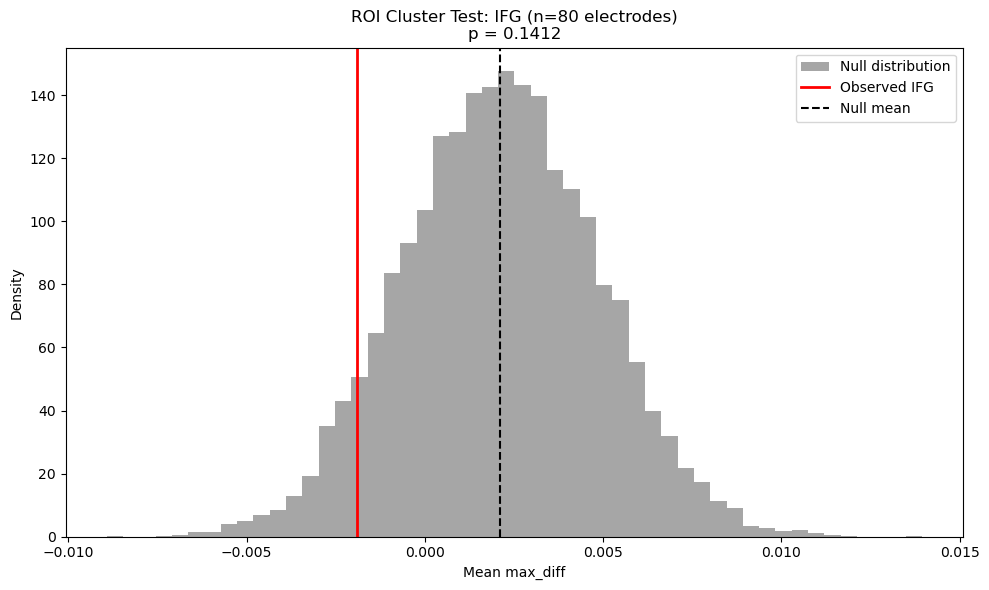

MTG                       (n= 54): mean_diff=-0.0024, p=0.1889


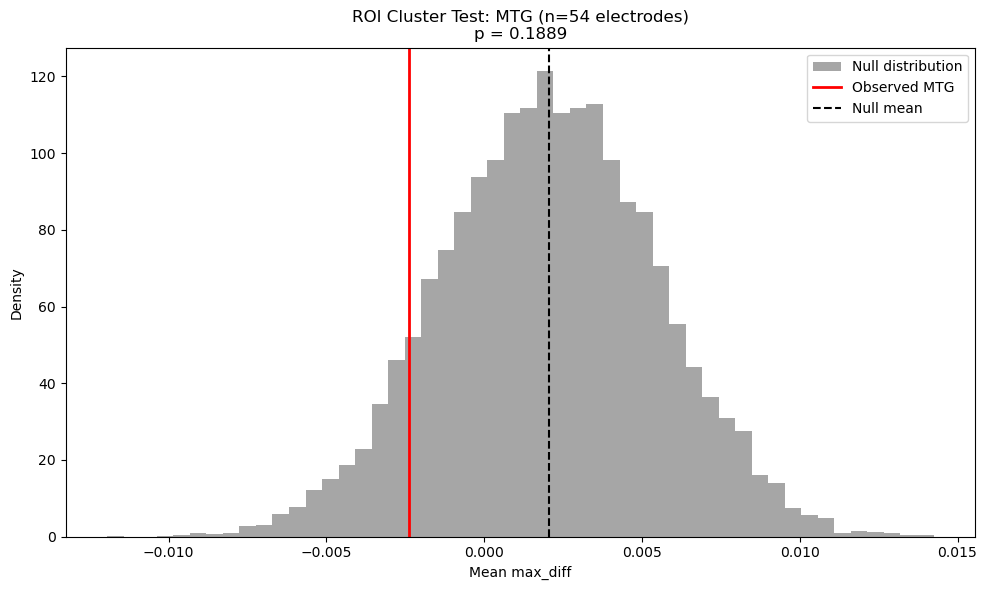

STG                       (n= 43): mean_diff= 0.0175, p=0.0000


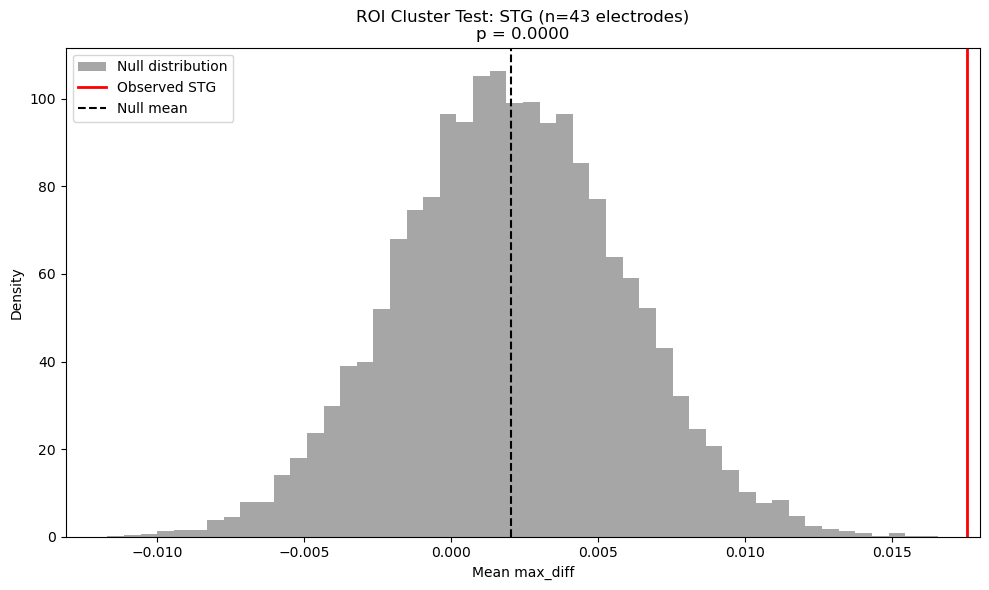

preCG                     (n= 43): mean_diff=-0.0016, p=0.3414


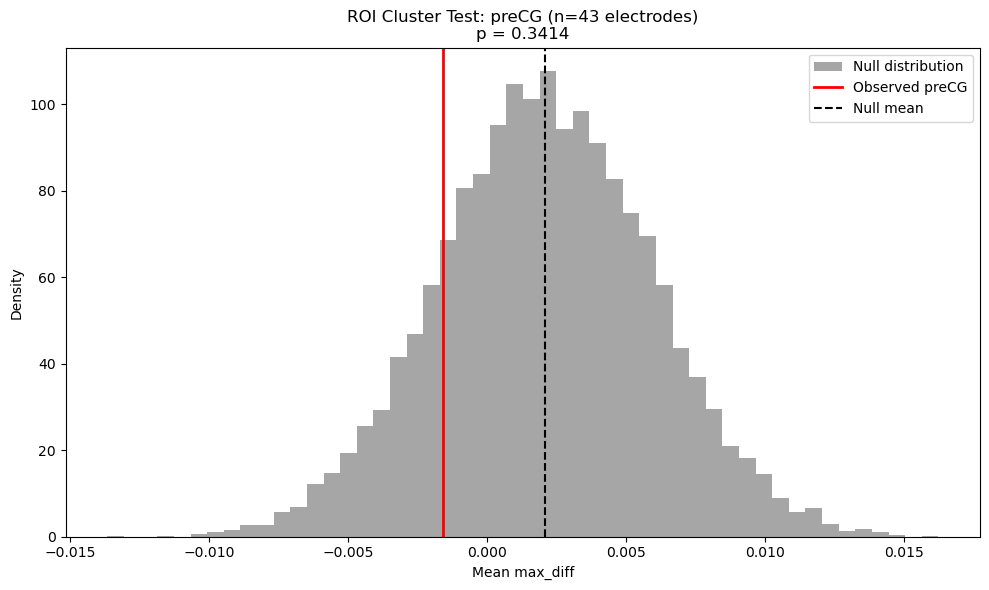

postCG                    (n= 55): mean_diff= 0.0067, p=0.1803


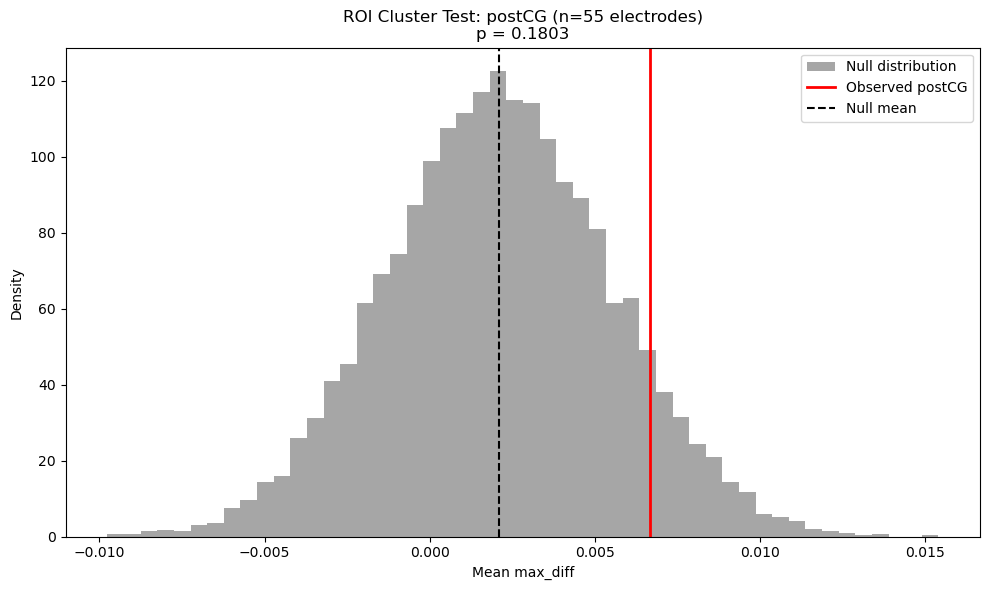

rostralmiddlefrontal      (n= 45): mean_diff=-0.0092, p=0.0031


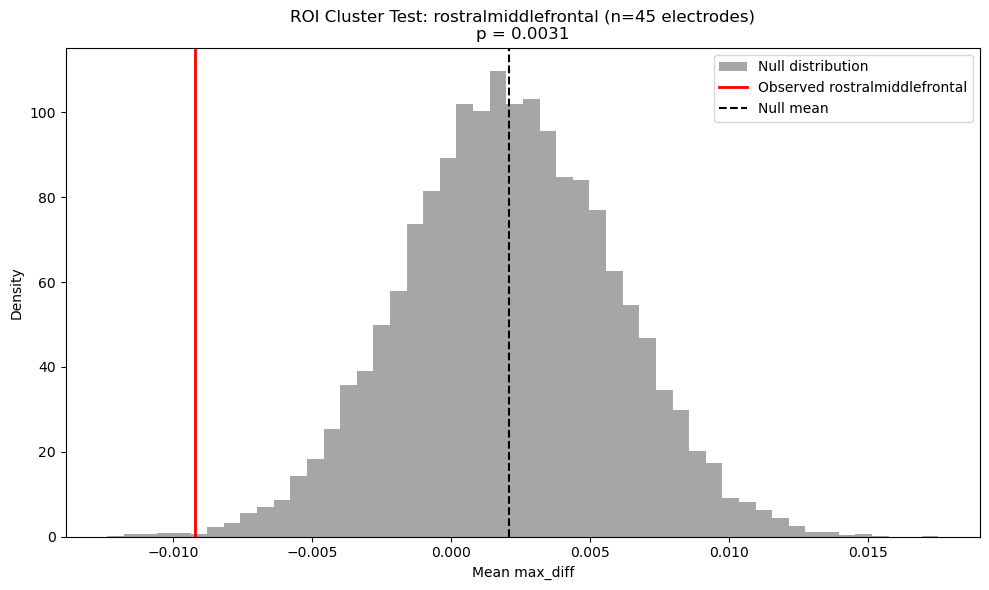

superiorfrontal           (n=  9): mean_diff=-0.0086, p=0.2154


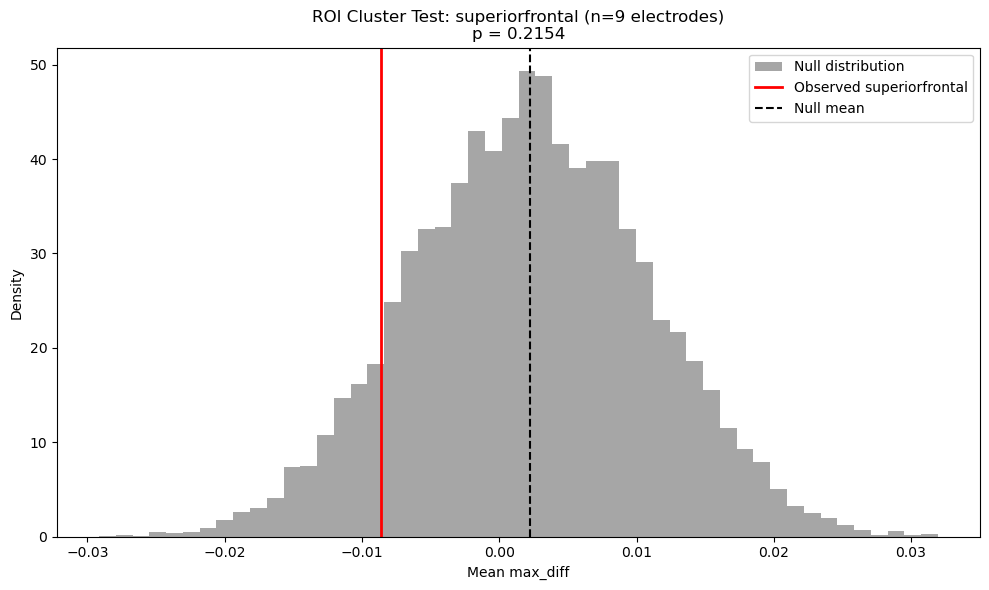

supramarginal             (n= 35): mean_diff=-0.0010, p=0.4829


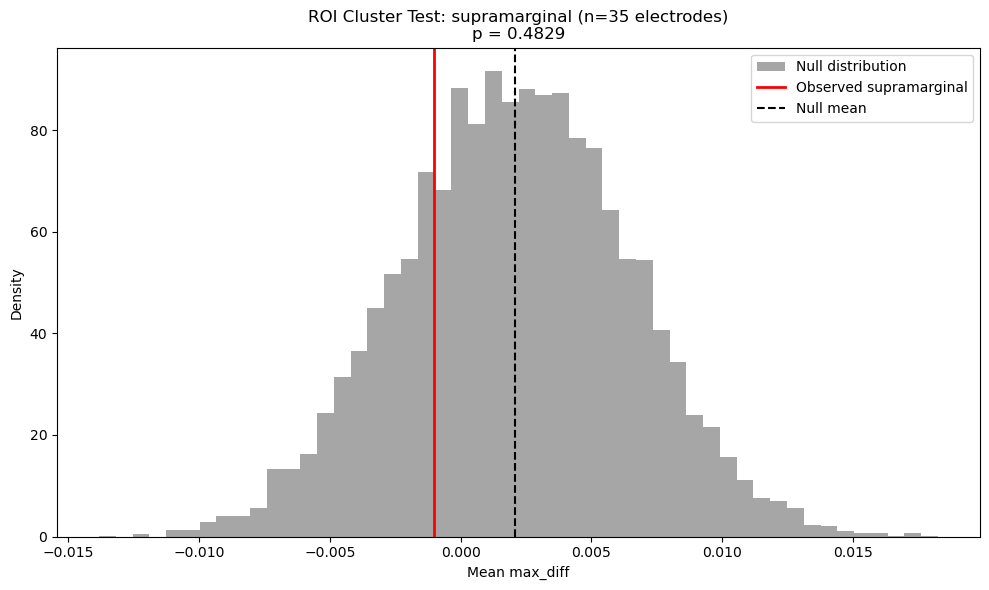

ITG                       (n= 23): mean_diff=-0.0073, p=0.0829


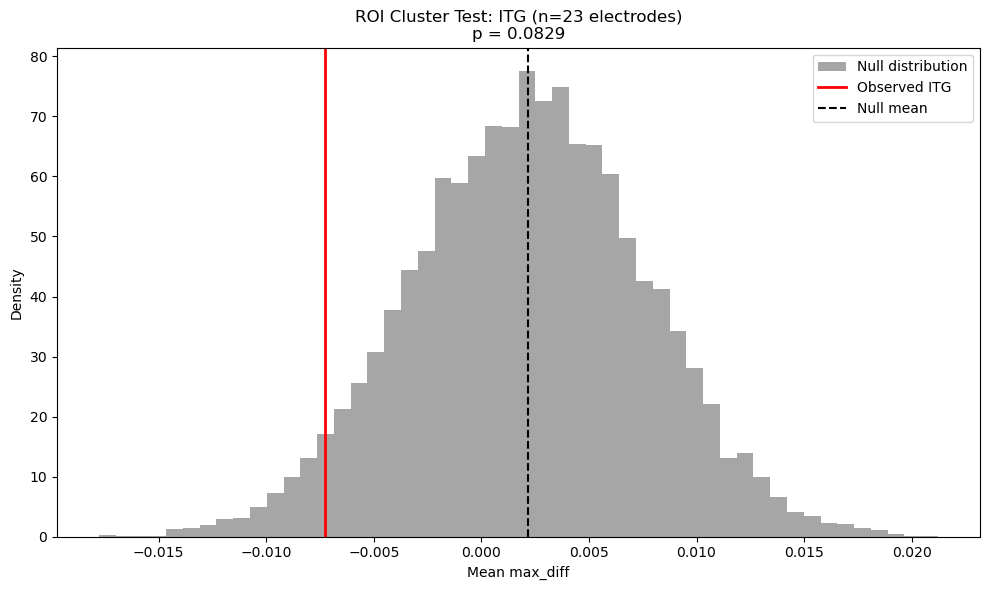

TP                        (n=  8): mean_diff=-0.0087, p=0.2468


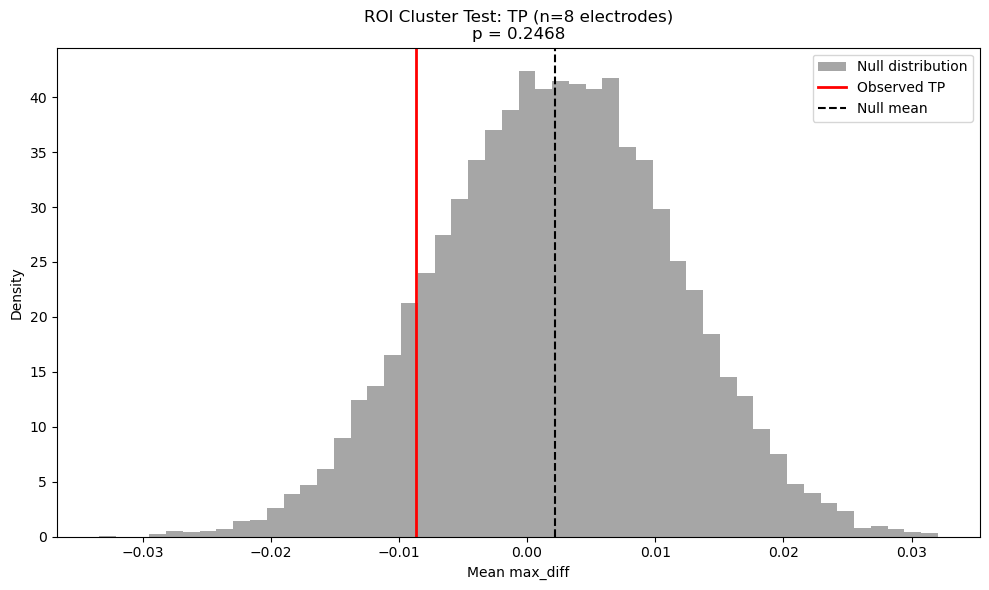

fusiform                  (n= 11): mean_diff=-0.0040, p=0.4504


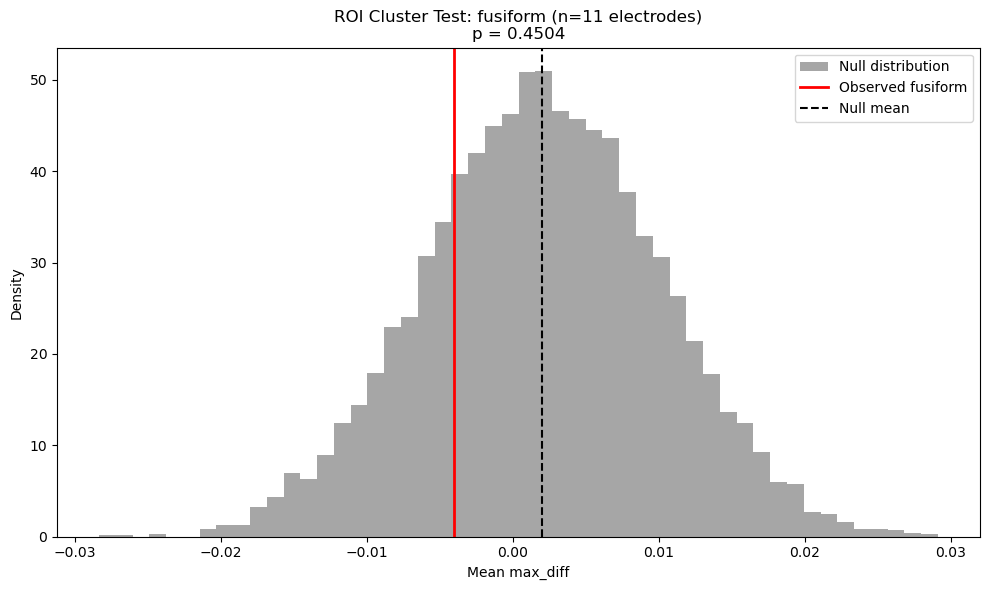

ROI All has too few electrodes (0)

Significant ROIs (p < 0.05): ['STG', 'rostralmiddlefrontal']


PRODUCTION - FUTURE (<0ms)
Comparing: Random content word vs Paraphrase
Computing differences for ALL electrodes (no filtering)

Total electrodes: 530

----------------------------------------------------------------------
ELECTRODE-LEVEL ANALYSIS
----------------------------------------------------------------------
Significant electrodes (FDR < 0.05): 0 / 530

Top 5 largest effects:
       electrode    roi  max_diff  p_adjusted
9    EEGGR_50REF  preCG  0.078368    0.768500
345           G7  preCG  0.085498    0.768500
321          G60   None  0.061636    0.894375
354          G61   None  0.058704    0.894375
356          G35  preCG  0.077760    0.894375

----------------------------------------------------------------------
ROI CLUSTER ANALYSIS (all ROIs)
----------------------------------------------------------------------
IFG                       (n= 80): mean_diff= 0.0002, p=0.2129

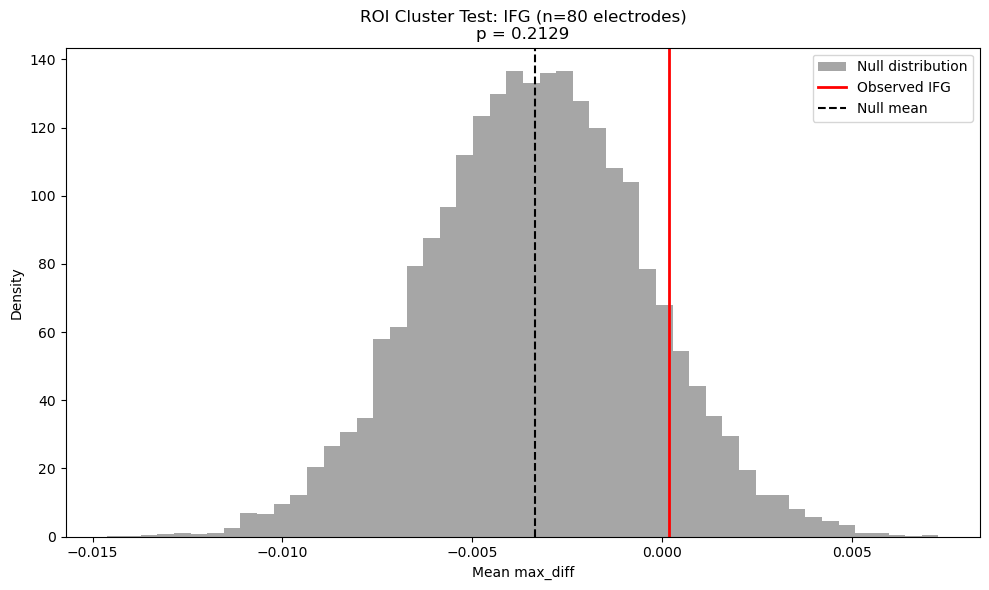

MTG                       (n= 50): mean_diff=-0.0111, p=0.0431


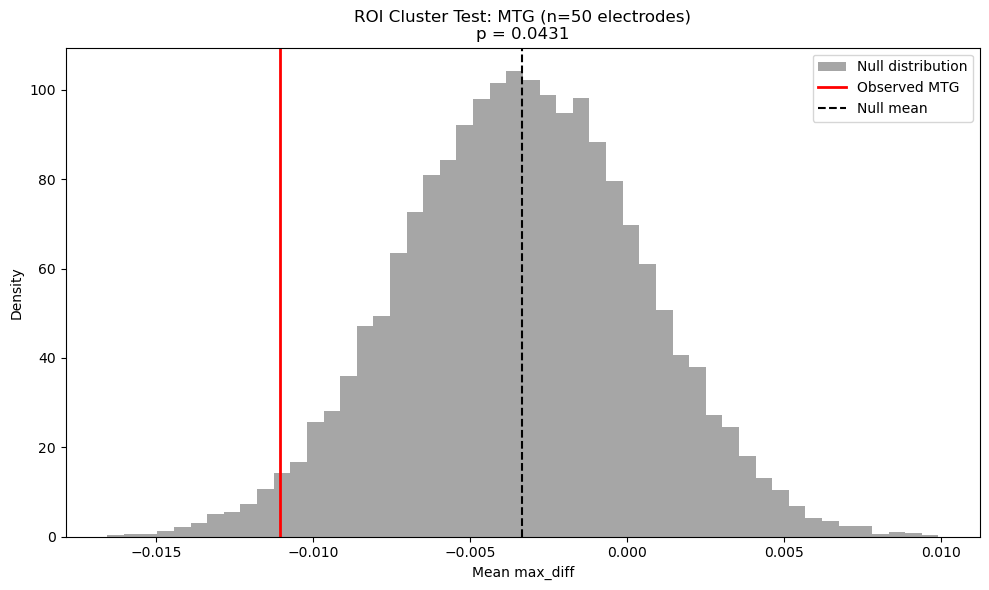

STG                       (n= 42): mean_diff=-0.0061, p=0.5128


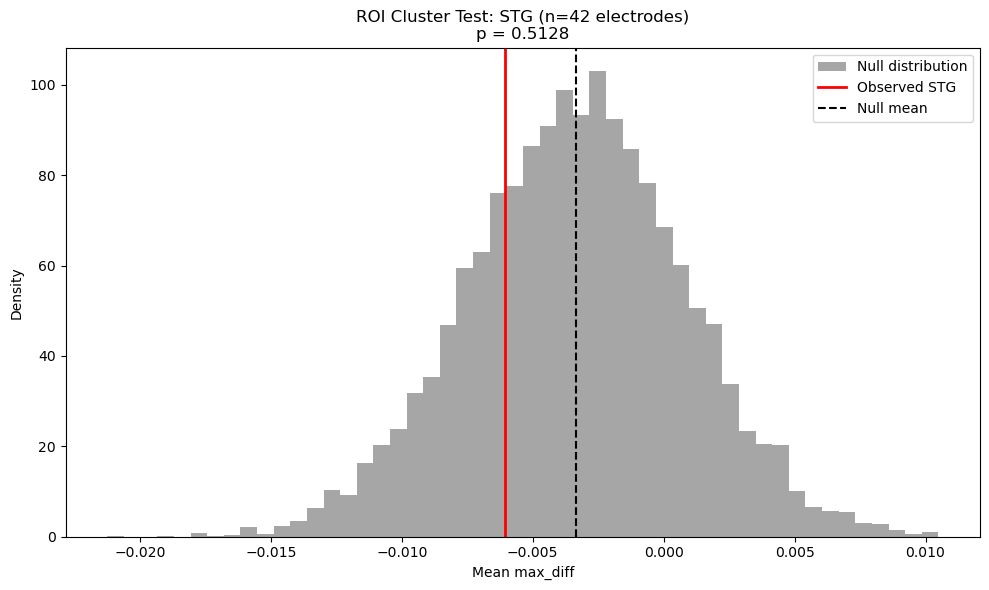

preCG                     (n= 43): mean_diff= 0.0180, p=0.0000


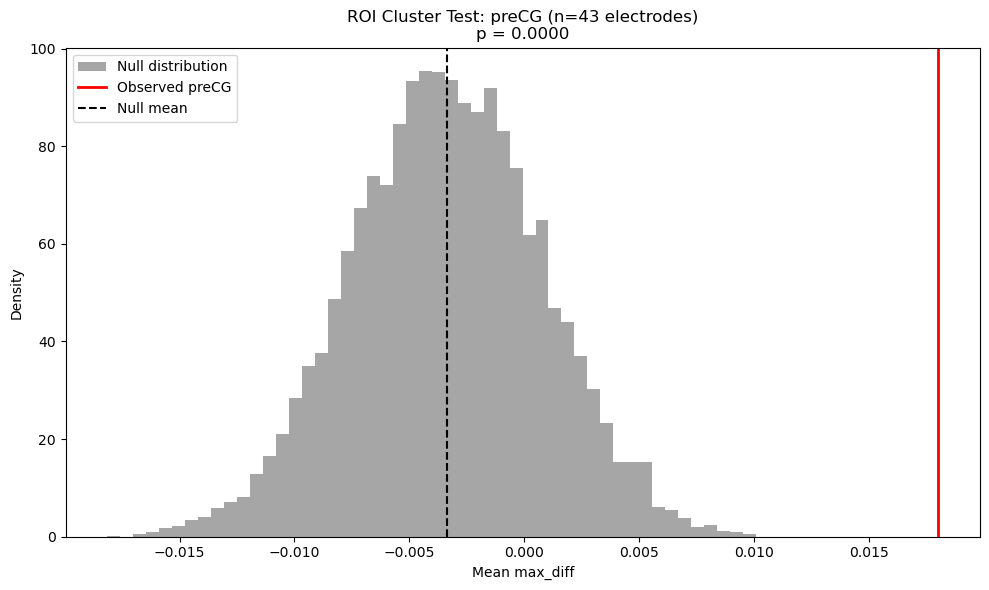

postCG                    (n= 55): mean_diff= 0.0006, p=0.2669


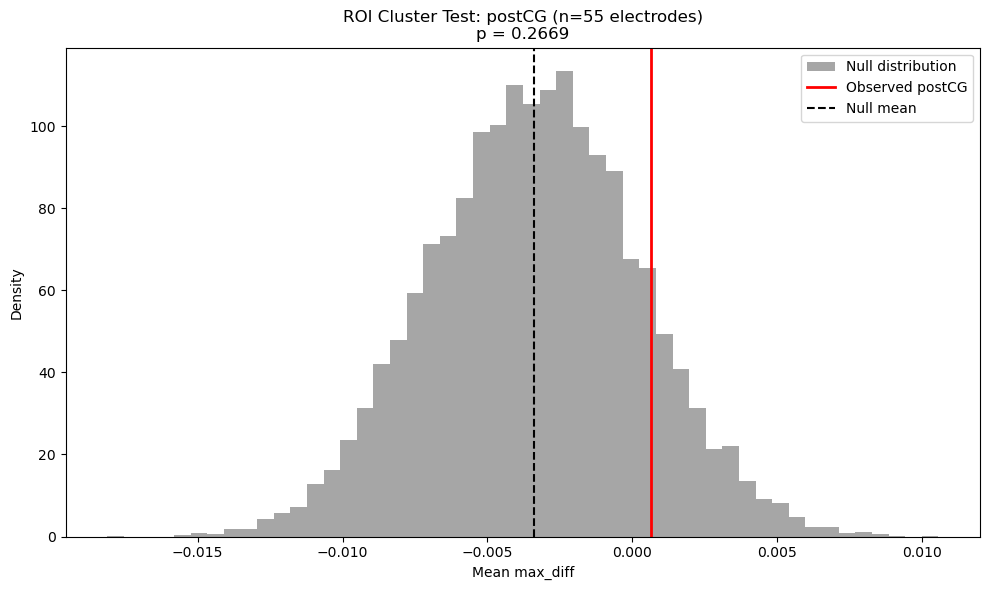

rostralmiddlefrontal      (n= 44): mean_diff=-0.0133, p=0.0130


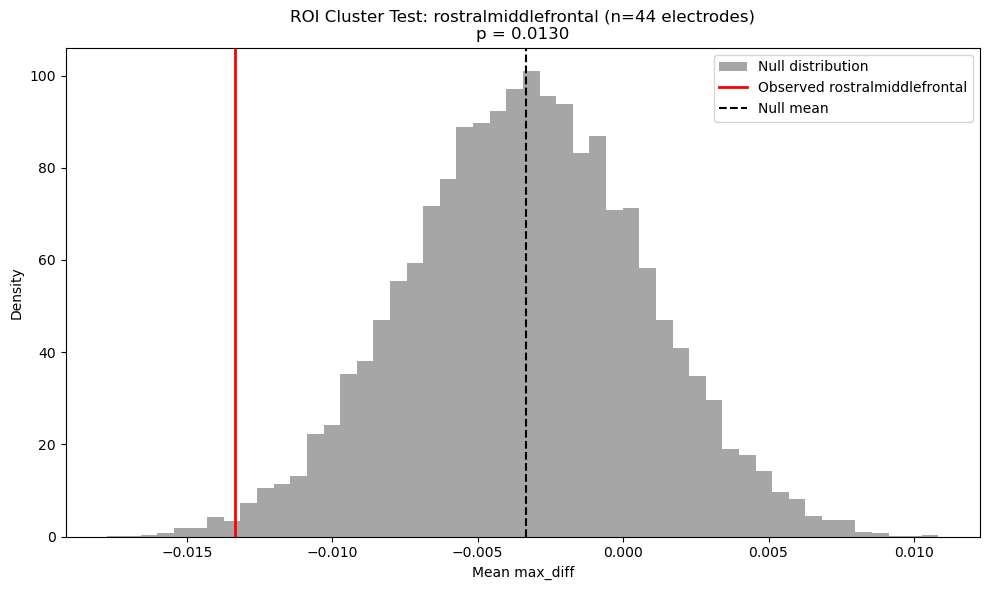

superiorfrontal           (n=  9): mean_diff=-0.0193, p=0.0838


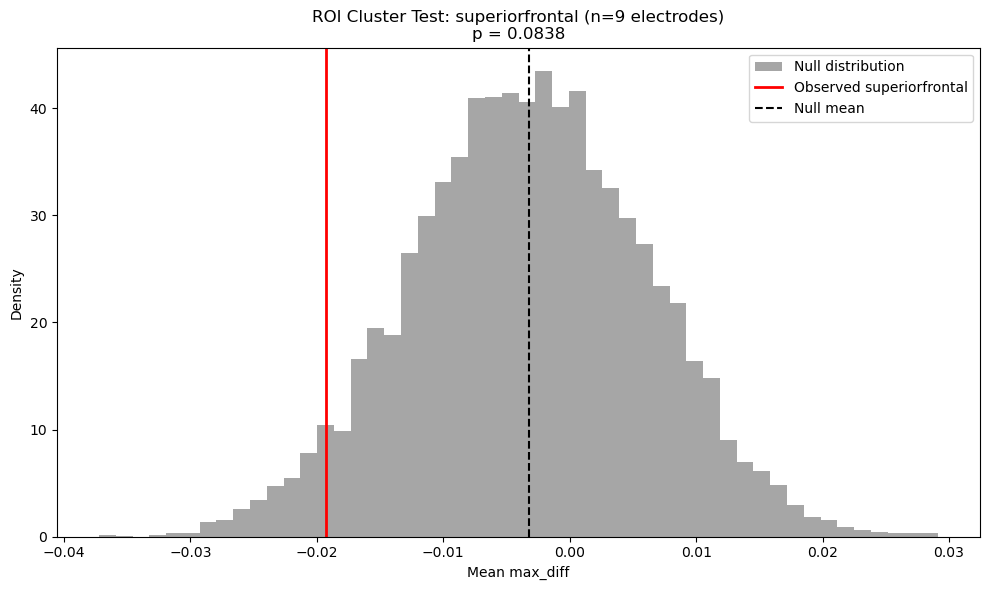

supramarginal             (n= 35): mean_diff=-0.0034, p=0.9884


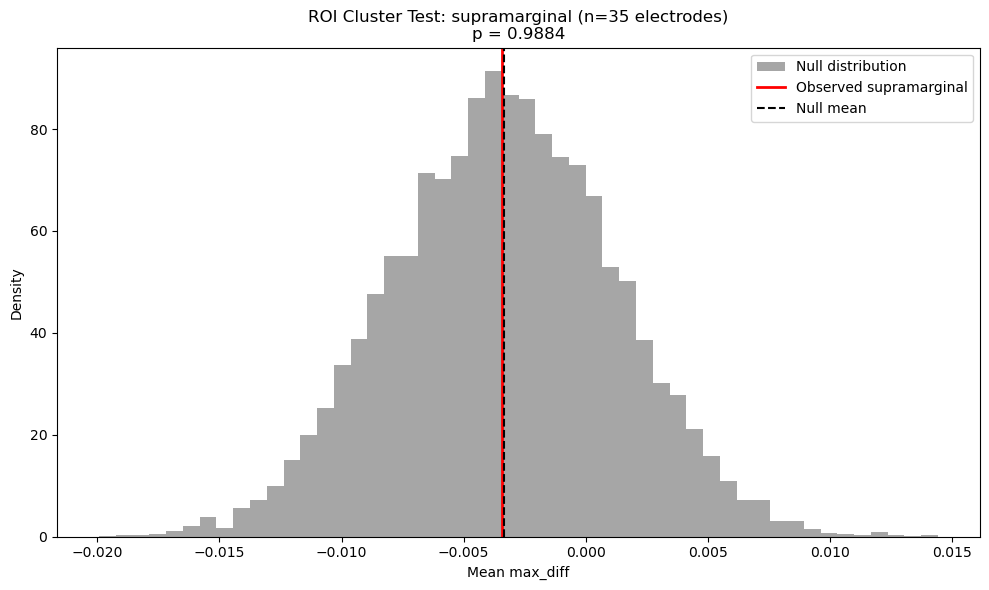

ITG                       (n= 23): mean_diff=-0.0132, p=0.0899


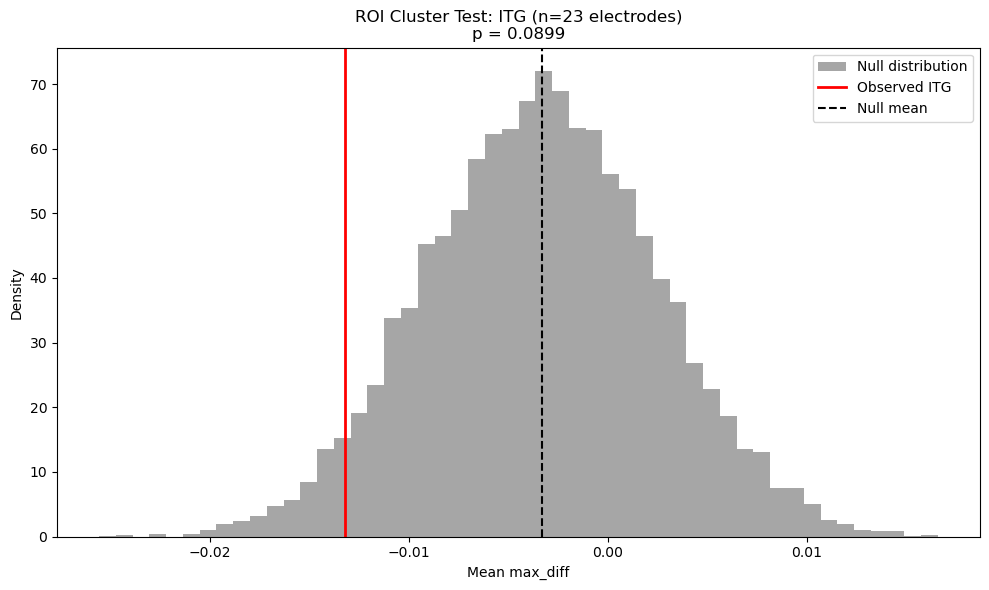

TP                        (n=  8): mean_diff= 0.0109, p=0.1493


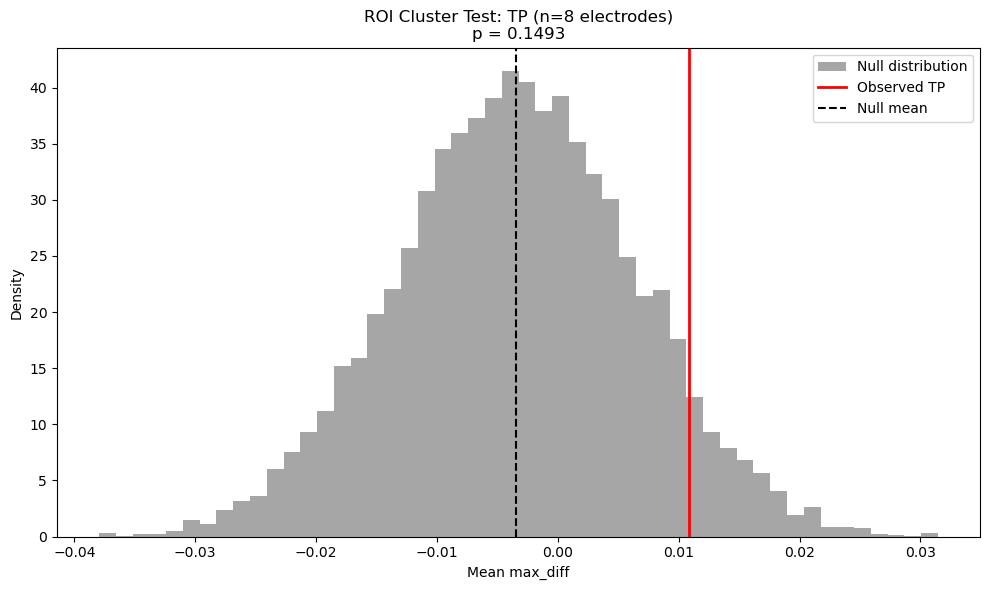

fusiform                  (n= 11): mean_diff=-0.0140, p=0.2082


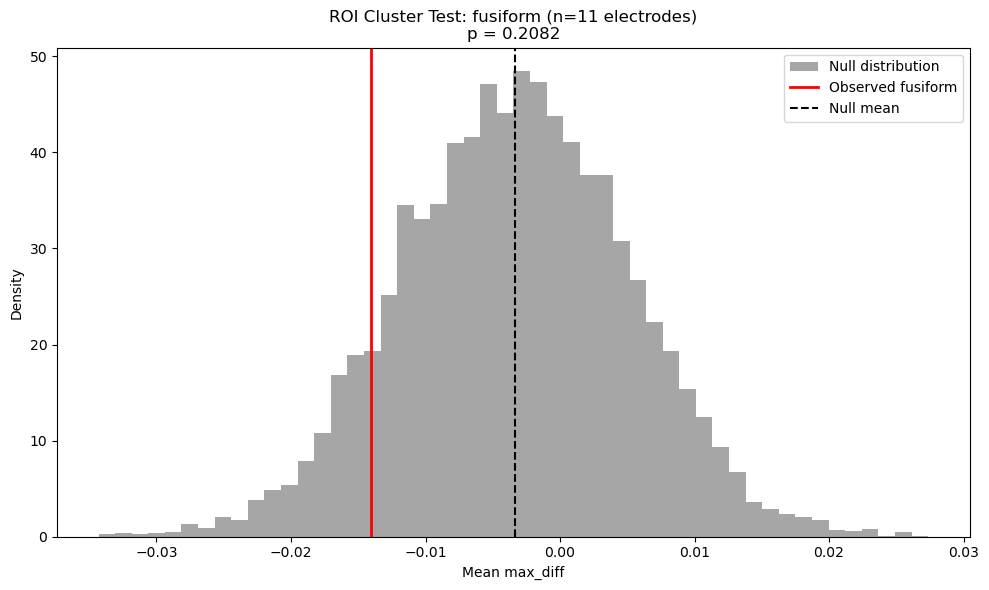

ROI All has too few electrodes (0)

Significant ROIs (p < 0.05): ['MTG', 'preCG', 'rostralmiddlefrontal']


SUMMARY
Comprehension (past >0ms): 2 significant ROIs out of 11
  STG: n=43, mean_diff=0.0175, p=0.0000
  rostralmiddlefrontal: n=45, mean_diff=-0.0092, p=0.0031

Production (future <0ms): 3 significant ROIs out of 11
  MTG: n=50, mean_diff=-0.0111, p=0.0431
  preCG: n=43, mean_diff=0.0180, p=0.0000
  rostralmiddlefrontal: n=44, mean_diff=-0.0133, p=0.0130


In [39]:
from tfsplt_directional_diff import calc_max_diff_directional

def plot_roi_permutation_test(observed_stat, null_stats, roi_name, p_value, n_electrodes):
    """Visualize permutation test results"""
    plt.figure(figsize=(10, 6))
    plt.hist(null_stats, bins=50, alpha=0.7, color='gray', 
             label='Null distribution', density=True)
    plt.axvline(observed_stat, color='red', linewidth=2, 
                label=f'Observed {roi_name}')
    plt.axvline(np.mean(null_stats), color='black', linestyle='--', 
                label='Null mean')
    plt.xlabel('Mean max_diff')
    plt.ylabel('Density')
    plt.title(f'ROI Cluster Test: {roi_name} (n={n_electrodes} electrodes)\np = {p_value:.4f}', fontsize=12)
    plt.legend()
    plt.tight_layout()
    plt.show()

# =============================================================================
# COMPREHENSION PAST (>0ms) - Sentence2 (past context)
# =============================================================================
print("="*70)
print("COMPREHENSION - PAST (>0ms)")
print("="*70)
print("Comparing: Random content word vs Paraphrase")
print("Computing differences for ALL electrodes (no filtering)\n")

diffs_comp_past = calc_max_diff_directional(
    random_content_word8_c, 
    paraphrase8_c, 
    "sentence2",  # Past context
    time_window_past_comp,  # >= 0ms
    percentile=0,
    min_abs_diff=0  # Include ALL electrodes
)
print(f"Total electrodes: {len(diffs_comp_past)}\n")

# Electrode-level analysis
print("-" * 70)
print("ELECTRODE-LEVEL ANALYSIS")
print("-" * 70)
diffs_sig_comp = test_electrode_significance(diffs_comp_past, n_permutations=10000)
print(f"Significant electrodes (FDR < 0.05): {diffs_sig_comp['significant'].sum()} / {len(diffs_sig_comp)}")
print("\nTop 5 largest effects:")
if len(diffs_sig_comp) > 0:
    print(diffs_sig_comp.nsmallest(5, 'p_adjusted')[['electrode', 'roi', 'max_diff', 'p_adjusted']])

# ROI cluster analysis - ALL ROIs
print("\n" + "-" * 70)
print("ROI CLUSTER ANALYSIS (all ROIs)")
print("-" * 70)

roi_results_comp = {}
for roi in args.rois:
    obs, p, null = test_roi_cluster(diffs_comp_past, roi, n_permutations=10000)
    if obs is not None:
        n_elecs_roi = len(diffs_comp_past[diffs_comp_past['roi'] == roi])
        roi_results_comp[roi] = {'observed': obs, 'p_value': p, 'n_electrodes': n_elecs_roi}
        print(f"{roi:25s} (n={n_elecs_roi:3d}): mean_diff={obs:7.4f}, p={p:.4f}")
        # if p < 0.05:  # Only plot significant ones
        plot_roi_permutation_test(obs, null, roi, p, n_elecs_roi)

sig_rois_comp = {k: v for k, v in roi_results_comp.items() if v['p_value'] < 0.05}
print(f"\nSignificant ROIs (p < 0.05): {list(sig_rois_comp.keys())}")

# =============================================================================
# PRODUCTION FUTURE (<0ms) - Sentence (future context)
# =============================================================================
print("\n\n" + "="*70)
print("PRODUCTION - FUTURE (<0ms)")
print("="*70)
print("Comparing: Random content word vs Paraphrase")
print("Computing differences for ALL electrodes (no filtering)\n")

diffs_prod_future = calc_max_diff_directional(
    random_content_word8_p, 
    paraphrase8_p, 
    "sentence",  # Future context
    time_window_future_prod,  # <= 0ms
    percentile=0,
    min_abs_diff=0  # Include ALL electrodes
)
print(f"Total electrodes: {len(diffs_prod_future)}\n")

# Electrode-level analysis
print("-" * 70)
print("ELECTRODE-LEVEL ANALYSIS")
print("-" * 70)
diffs_sig_prod = test_electrode_significance(diffs_prod_future, n_permutations=10000)
print(f"Significant electrodes (FDR < 0.05): {diffs_sig_prod['significant'].sum()} / {len(diffs_sig_prod)}")
print("\nTop 5 largest effects:")
if len(diffs_sig_prod) > 0:
    print(diffs_sig_prod.nsmallest(5, 'p_adjusted')[['electrode', 'roi', 'max_diff', 'p_adjusted']])

# ROI cluster analysis - ALL ROIs
print("\n" + "-" * 70)
print("ROI CLUSTER ANALYSIS (all ROIs)")
print("-" * 70)

roi_results_prod = {}
for roi in args.rois:
    obs, p, null = test_roi_cluster(diffs_prod_future, roi, n_permutations=10000)
    if obs is not None:
        n_elecs_roi = len(diffs_prod_future[diffs_prod_future['roi'] == roi])
        roi_results_prod[roi] = {'observed': obs, 'p_value': p, 'n_electrodes': n_elecs_roi}
        print(f"{roi:25s} (n={n_elecs_roi:3d}): mean_diff={obs:7.4f}, p={p:.4f}")
        # if p < 0.05:  # Only plot significant ones
        plot_roi_permutation_test(obs, null, roi, p, n_elecs_roi)

sig_rois_prod = {k: v for k, v in roi_results_prod.items() if v['p_value'] < 0.05}
print(f"\nSignificant ROIs (p < 0.05): {list(sig_rois_prod.keys())}")

# =============================================================================
# SUMMARY
# =============================================================================
print("\n\n" + "="*70)
print("SUMMARY")
print("="*70)
print(f"Comprehension (past >0ms): {len(sig_rois_comp)} significant ROIs out of {len(roi_results_comp)}")
if sig_rois_comp:
    for roi, vals in sig_rois_comp.items():
        print(f"  {roi}: n={vals['n_electrodes']}, mean_diff={vals['observed']:.4f}, p={vals['p_value']:.4f}")

print(f"\nProduction (future <0ms): {len(sig_rois_prod)} significant ROIs out of {len(roi_results_prod)}")
if sig_rois_prod:
    for roi, vals in sig_rois_prod.items():
        print(f"  {roi}: n={vals['n_electrodes']}, mean_diff={vals['observed']:.4f}, p={vals['p_value']:.4f}")